In [1]:
#!/usr/bin/env Rscript 
library(dplyr)
library(Seurat)
library(httr)
library(readr)
library(pheatmap)
library(RColorBrewer)
library(ggplot2)
library(cowplot)
library(patchwork)
library(unixtools)
library(ggrepel)
library(repr)
library(ggmin)
library(harmony)
library(SeuratWrappers)
library(Nebulosa)
library(ggthemes)
library(scales)
set_config(config(ssl_verifypeer = 0L))
ulimit::memory_limit(100000)
set.tempdir("/datastore/lucy/tmp/")
setwd("/datastore/lucy/SynovialAtlas")
options(warn = -1, verbose=FALSE)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots


Loading required package: Rcpp


Attaching package: ‘ggthemes’


The following object is masked from ‘package:cowplot’:

    theme_map



Attaching package: ‘scales’


The following object is ma

soft  hard 
1e+05   Inf

# Load the preprocessed data of all synovial tissue and peripheral blood cells from all experiments

In [2]:
syno <- readRDS("/datastore/MKS_Data/UNpublished/DC_paper_Immunity/Immunity_Oxford+Glasgow1-3.rds")

In [3]:
syno

An object of class Seurat 
45231 features across 144324 samples within 2 assays 
Active assay: RNA (45068 features, 2000 variable features)
 1 other assay present: ADT
 3 dimensional reductions calculated: pca, harmony, umap

In [86]:
unique(syno$Donor)

[1] "HC0547"       "HC0572"       "HC0732"       "SA138"        "SA146"       
 [6] "SA172"        "SA132"        "SA160"        "SA161"        "SA174"       
[11] "SA144"        "SA151"        "SA166"        "HC0701"       "SA131"       
[16] "SA145"        "SA139"        "SA159"        "SA168"        "SA220"       
[21] "SA222"        "SA225"        "SA227"        "SA272"        "SA271"       
[26] "SA276"        "PBMC_10X"     "A1"           "A10-RNA"      "A2_HTO2"     
[31] "A5_HTO5"      "A5_HTO3"      "A7_HTO5"      "A7_HTO4"      "A8"          
[36] "A9-RNA"       "A3"           "O1_PB_HD4_MS" "O1_PB_HD3_ML" "O1_PB_HD2_C" 
[41] "O1_PB_HD1_A"  "O3_PB_HD1_A"  "O3_PB_HD3_ML" "O3_PB_HD4_MS" "O3_PB_HD2_C"

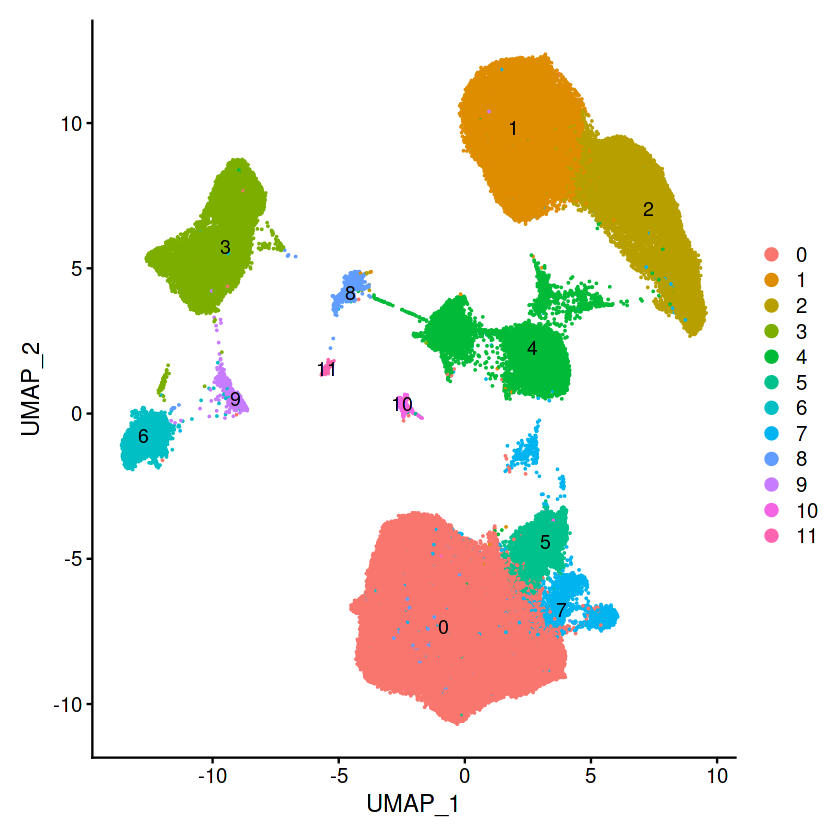

In [6]:
DimPlot(syno, raster=FALSE, label=TRUE)

# Fix Metadata

In [87]:
unique(syno$Donor)

[1] "HC0547"       "HC0572"       "HC0732"       "SA138"        "SA146"       
 [6] "SA172"        "SA132"        "SA160"        "SA161"        "SA174"       
[11] "SA144"        "SA151"        "SA166"        "HC0701"       "SA131"       
[16] "SA145"        "SA139"        "SA159"        "SA168"        "SA220"       
[21] "SA222"        "SA225"        "SA227"        "SA272"        "SA271"       
[26] "SA276"        "PBMC_10X"     "A1"           "A10-RNA"      "A2_HTO2"     
[31] "A5_HTO5"      "A5_HTO3"      "A7_HTO5"      "A7_HTO4"      "A8"          
[36] "A9-RNA"       "A3"           "O1_PB_HD4_MS" "O1_PB_HD3_ML" "O1_PB_HD2_C" 
[41] "O1_PB_HD1_A"  "O3_PB_HD1_A"  "O3_PB_HD3_ML" "O3_PB_HD4_MS" "O3_PB_HD2_C"

In [14]:
syno$Donor<- plyr::revalue(as.character(syno$Donor),
                                c(
                                "NaiveSA131" = 'SA131',
                                  "NaiveSA138" = 'SA138',
                                  "NaiveSA146" = 'SA146',
                                  "NaiveSA172" = 'SA172',
                                  "SA271_SYN" = 'SA271',
                                  "SA271_Blood_new" = 'SA271',
                                  "SA276_SYN" = 'SA276',
                                  "SA276_Blood" = 'SA276',
                                  "ResistantSA144" = 'SA144',
                                 "ResistantSA145" = 'SA145',
                                  "ResistantSA151" = 'SA151',
                                  "ResistantSA166" = 'SA166',
                                 "SA272_SYN" = 'SA272',
                                  "SA272_Blood" = 'SA272',
                                 "RemSA132" = 'SA132',
                                 "RemSA160" = 'SA160',
                                 "RemSA161" = 'SA161',
                                 "RemSA174" = 'SA174'))

In [98]:
syno$group <- plyr::revalue(as.character(syno$Donor),
                                c("HC0547" = 'Healthy',
                                  "HC0572" = 'Healthy',
                                  "HC0701" = 'Healthy',
                                  "HC0732" = 'Healthy',
                                  "PBMC_10X"= 'Healthy',
                                  "A5_HTO5"='Healthy',
                                  "A2_HTO2"='Healthy',
                                  "A7_HTO5"='Healthy',
                                "SA131" = 'Naive RA',
                                  "SA138" = 'Naive RA',
                                  "SA146" = 'Naive RA',
                                  "SA172" = 'Naive RA',
                                  "SA139" = 'Naive RA',
                                  "SA220" = 'Naive RA',
                                  "SA271" = 'Naive RA',
                                  "SA276" = 'Naive RA',
                                  "SA144" = 'Resistant to cDMARDs RA',
                                 "SA145" = 'Resistant to cDMARDs RA',
                                  "SA151" = 'Resistant to cDMARDs RA',
                                  "SA166" = 'Resistant to cDMARDs RA',
                                 "SA222" = 'Resistant to cDMARDs RA',
                                 "SA227" = 'Resistant to cDMARDs RA',
                                 "SA272" = 'Resistant to cDMARDs RA',
                                  "A1" = 'Resistant to bDMARDs RA',
                                  "A3" = 'Resistant to bDMARDs RA',
                                  "A5_HTO3"='Difficult to treat RA',
                                  "A7_HTO4"='Difficult to treat RA',
                                  "A8"='Difficult to treat RA',
                                 "SA132" = 'Remission RA',
                                 "SA160" = 'Remission RA',
                                 "SA161" = 'Remission RA',
                                 "SA174" = 'Remission RA',
                                 "SA159" = 'Remission RA',
                                 "SA168" = 'Remission RA',
                                 "SA225" = 'Remission RA',
                                 "A10-RNA" = 'Remission RA',
                                 "A9-RNA" = 'Remission RA',
                                 'O1_PB_HD4_MS'='Healthy',
                                  'O1_PB_HD3_ML'='Healthy',
                                  'O1_PB_HD2_C'='Healthy',
                                  'O1_PB_HD1_A'='Healthy',
                                  'O3_PB_HD1_A'='Healthy',
                                  'O3_PB_HD3_ML'='Healthy',
                                  'O3_PB_HD4_MS'='Healthy',
                                  'O3_PB_HD2_C'='Healthy'))

In [93]:
syno$group <- as.ordered(factor(syno$group, levels=c("Healthy","Naive RA","Resistant to cDMARDs RA",
                                                     "Resistant to bDMARDs RA","Difficult to treat RA",
                                                    "Remission RA")))

In [99]:
table(syno$group)


  Difficult to treat RA                 Healthy                Naive RA 
                   7022                   31703                   52068 
           Remission RA Resistant to bDMARDs RA Resistant to cDMARDs RA 
                  18572                    1866                   32620 

In [100]:
syno$condition <- plyr::revalue(as.character(syno$group),
                                c('Naive RA'='Active RA',
                                 'Resistant to cDMARDs RA'='Active RA',
                                 'Resistant to bDMARDs RA'='Active RA',
                                 'Difficult to treat RA'='Active RA'))

In [101]:
syno$condition <- as.ordered(factor(syno$condition, levels=c("Healthy","Active RA",
                                                    "Remission RA")))

In [102]:
unique(syno$Donor)

[1] "HC0547"       "HC0572"       "HC0732"       "SA138"        "SA146"       
 [6] "SA172"        "SA132"        "SA160"        "SA161"        "SA174"       
[11] "SA144"        "SA151"        "SA166"        "HC0701"       "SA131"       
[16] "SA145"        "SA139"        "SA159"        "SA168"        "SA220"       
[21] "SA222"        "SA225"        "SA227"        "SA272"        "SA271"       
[26] "SA276"        "PBMC_10X"     "A1"           "A10-RNA"      "A2_HTO2"     
[31] "A5_HTO5"      "A5_HTO3"      "A7_HTO5"      "A7_HTO4"      "A8"          
[36] "A9-RNA"       "A3"           "O1_PB_HD4_MS" "O1_PB_HD3_ML" "O1_PB_HD2_C" 
[41] "O1_PB_HD1_A"  "O3_PB_HD1_A"  "O3_PB_HD3_ML" "O3_PB_HD4_MS" "O3_PB_HD2_C"

In [16]:
unique(syno@meta.data$Experiment)

[1] "Oxford"      "Glasgow1"    "Glasgow2_ST" "Glasgow2_PB" "10X"        
[6] "Glasgow3"

In [17]:
syno$Experiment <- plyr::revalue(syno$Experiment, c("Glasgow2_PB"='Glasgow2',"Glasgow2_ST"='Glasgow2'))

In [18]:
unique(syno@meta.data$Experiment)

[1] "Oxford"   "Glasgow1" "Glasgow2" "10X"      "Glasgow3"

In [19]:
syno$Platform <- "10x Genomics"

# Load the peripheral blood baseline cells enriched for HLADRpos from organoid experiment with BDRhapsody

In [21]:
rhapsody <- readRDS("/datastore/MKS_Data/UNpublished/DC_paper_Immunity/temp_organoid_PB.rds")

In [22]:
rhapsody

An object of class Seurat 
29200 features across 14765 samples within 1 assay 
Active assay: RNA (29200 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [23]:
unique(rhapsody@meta.data$Tissue)

[1] "Organoid" "PB"

In [24]:
rhapsody$Donor <- rhapsody$Unique_ID

In [25]:
rhapsody$Platform <- rhapsody$platform

In [26]:
#Keep only baseline blood
rhapsody <- subset(rhapsody, subset = Tissue == "PB")

In [27]:
rhapsody$group <- "Healthy"
rhapsody$condition <- "Healthy"
rhapsody$Tissue <- "PB"

# Merge HLADRpos baseline blood from organoid exp. with other 10x blood and syno data

In [28]:
common.features <- intersect(rownames(syno), rownames(rhapsody))
length(x = common.features)

[1] 19143

In [29]:
# Merge based on common features only
syno <- merge(syno[common.features, ], rhapsody[common.features, ])

In [30]:
#Continue with typical preprocessing pipeline
syno <- syno %>%
    NormalizeData() %>%
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
    ScaleData() %>% RunPCA()

Centering and scaling data matrix

PC_ 1 
Positive:  COL1A2, C1R, PLAC9, C1S, LUM, PCOLCE, COL6A2, CCDC80, NNMT, DCN 
	   MGP, FSTL1, COL3A1, COL6A1, SPARC, CALD1, TIMP3, CLU, PLA2G2A, EFEMP1 
	   COL1A1, BGN, MMP2, ISLR, DPT, COL6A3, PRG4, MXRA8, HTRA1, PPIC 
Negative:  CTSS, CXCR4, LYZ, SAMHD1, LST1, LTB, SELL, MNDA, PLAC8, ITGA4 
	   CYBB, S100A9, FCN1, POU2F2, VSIR, JAML, TRBC2, IL7R, FGR, CD2 
	   CD3D, MPEG1, NCF2, S100A8, SPN, ADA2, CD3G, CPVL, CD3E, ISG20 
PC_ 2 
Positive:  IL32, TRBC2, CD3D, LTB, TRAC, CD3G, CD2, CD3E, CD7, CD247 
	   GZMM, SYNE2, TRBC1, GZMA, IL7R, CCL5, NKG7, IFITM1, ISG20, CST7 
	   SPOCK2, CTSW, BCL11B, TCF7, IKZF3, LINC00861, PLAC8, SAMD3, HOPX, KLRB1 
Negative:  CTSB, CST3, FTL, HLA-DRA, FTH1, CD68, CTSZ, HLA-DRB1, CD14, C1QA 
	   CD74, C1QB, RNASE1, C1QC, GLUL, CD163, HLA-DPA1, MAFB, VSIG4, MARCO 
	   MS4A7, TGFBI, HLA-DPB1, CTSL, SGK1, LGMN, HLA-DQB1, FOLR2, PLAUR, LYZ 
PC_ 3 
Positive:  FCN1, VCAN, MNDA, CSF3R, MPEG1, MEGF9, SERPINA1, FGR, NCF2, CPPED

# Integration with harmony

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations

13:47:34 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:47:34 Read 155662 rows and found 40 numeric columns

13:47:34 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:47:34 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:48:02 Writing NN index file to temp file /datastore/lucy/tmp//file6766a2bacb38e

13:48:02 Searching Annoy index using 1 thread, search_k = 3000

13:49:40 Annoy recall = 100%

13:49:41 Commencing smooth kNN di

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 155662
Number of edges: 5002150

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9263
Number of communities: 28
Elapsed time: 185 seconds


2 singletons identified. 26 final clusters.



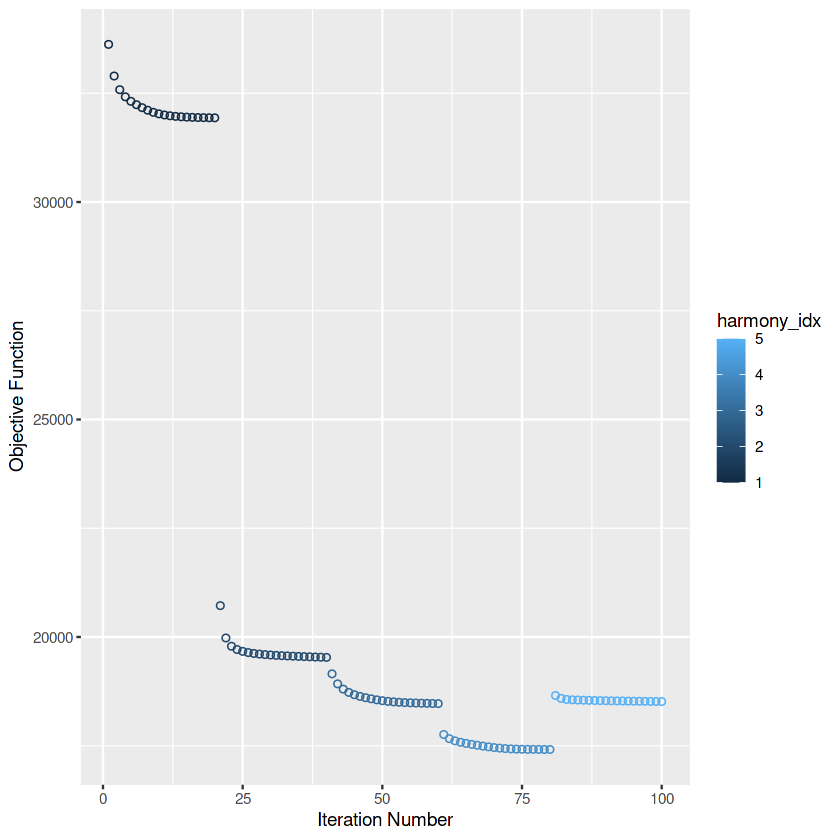

In [31]:
syno <- syno %>% 
    RunHarmony(group.by.vars=c("Donor","Experiment","Tissue", "Platform"), plot_convergence = TRUE, theta=c(0,1,0,0))
#Run UMAP and clustering 
syno <- RunUMAP(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindNeighbors(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindClusters(syno, res=0.6)

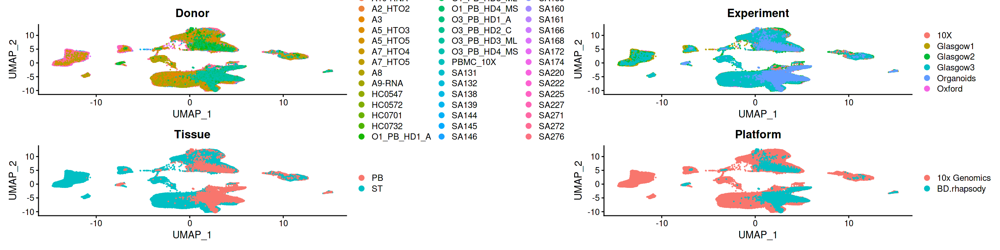

In [32]:
options(repr.plot.width=20, repr.plot.height=5)
DimPlot(syno, group.by=c("Donor","Experiment","Tissue", "Platform"), raster=FALSE)

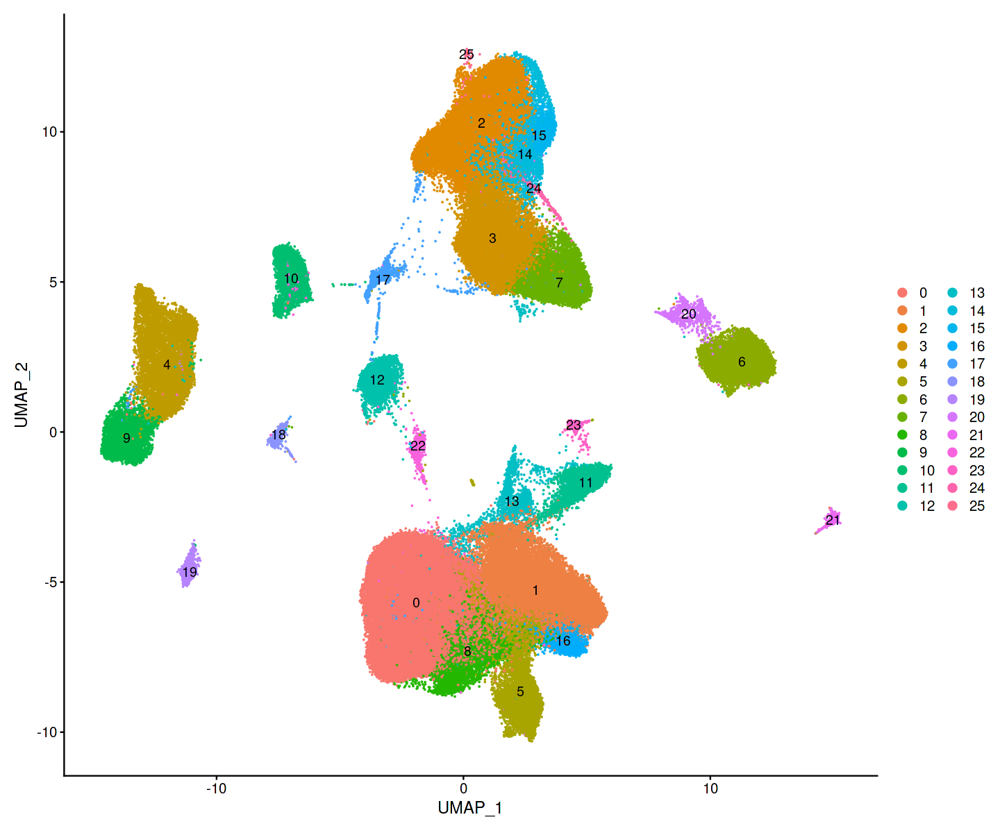

In [33]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

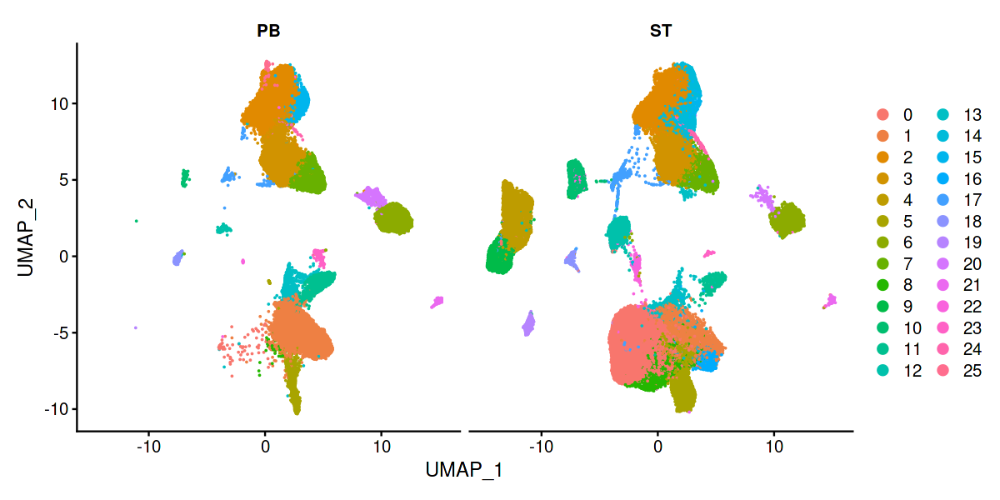

In [34]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Tissue")

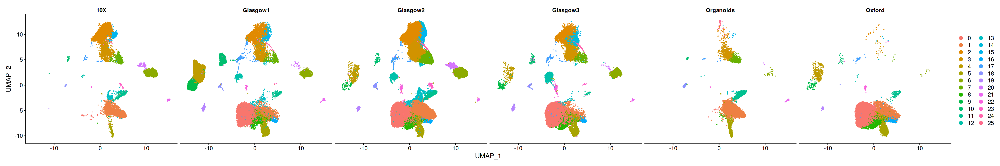

In [35]:
options(repr.plot.width=30, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Experiment")

# Identify and remove doublets

In [38]:
unique(colnames(syno@meta.data))

[1] "orig.ident"               "nCount_RNA"              
 [3] "nFeature_RNA"             "percent.mt"              
 [5] "percent.hb"               "percent.ribo"            
 [7] "RNA_snn_res.0.1"          "seurat_clusters"         
 [9] "pANN_0.25_0.09_3"         "Doublets Low Confidence" 
[11] "Doublets High Confidence" "pANN_0.25_0.24_11"       
[13] "pANN_0.25_0.12_2"         "pANN_0.25_0.01_13"       
[15] "pANN_0.25_0.01_9"         "pANN_0.25_0.25_13"       
[17] "pANN_0.25_0.03_9"         "pANN_0.25_0.04_2"        
[19] "pANN_0.25_0.02_4"         "pANN_0.25_0.28_6"        
[21] "pANN_0.25_0.09_10"        "pANN_0.25_0.26_6"        
[23] "pANN_0.25_0.04_5"         "pANN_0.25_0.1_16"        
[25] "pANN_0.25_0.09_1"         "pANN_0.25_0.03_2"        
[27] "Experiment"               "Tissue"                  
[29] "Unique_ID"                "Cont"                    
[31] "pANN_0.25_0.23_447"       "pANN_0.25_0.01_39"       
[33] "pANN_0.25_0.3_98"         "pANN_0.25_0.05_13"       
[35] "pANN_0.25_0.005_101"      "pANN_0.25_0.05_15"       
[37] "pANN_0.25_0.005_86"       "pANN_0.25_0.27_454"      
[39] "pANN_0.25_0.3_52"         "pANN_0.25_0.09_662"      
[41] "pANN_0.25_0.005_744"      "pANN_0.25_0.005_680"     
[43] "pANN_0.25_0.26_674"       "pANN_0.25_0.12_500"      
[45] "nCount_ADT"               "nFeature_ADT"            
[47] "Name.exp"                 "Tagging"                 
[49] "SampleID"                 "Condition"               
[51] "Exp"                      "pANN_0.25_0.03_8"        
[53] "pANN_0.25_0.27_27"        "HTO"                     
[55] "HTO_status"               "pANN_0.25_0.27_1"        
[57] "pANN_0.25_0.15_346"       "pANN_0.25_0.005_291"     
[59] "SNP_cluster"              "SNP_status"              
[61] "pANN_0.25_0.12_5"         "pANN_0.25_0.04_4"        
[63] "pANN_0.25_0.14_20"        "pANN_0.25_0.21_39"       
[65] "pANN_0.25_0.3_2"          "celltype"                
[67] "group"                    "condition"               
[69] "Donor"                    "Platform"                
[71] "Cell_Type_Experimental"   "Sample_Tag"              
[73] "Sample_Name"              "pANN_0.25_0.28_305"      
[75] "pANN_0.25_0.22_29"        "pANN_0.25_0.09_135"      
[77] "Origin"                   "platform"                
[79] "RNA_snn_res.0.6"

In [39]:
syno$lowDoublets <- syno$'Doublets Low Confidence'
syno$highDoublets <- syno$'Doublets High Confidence'

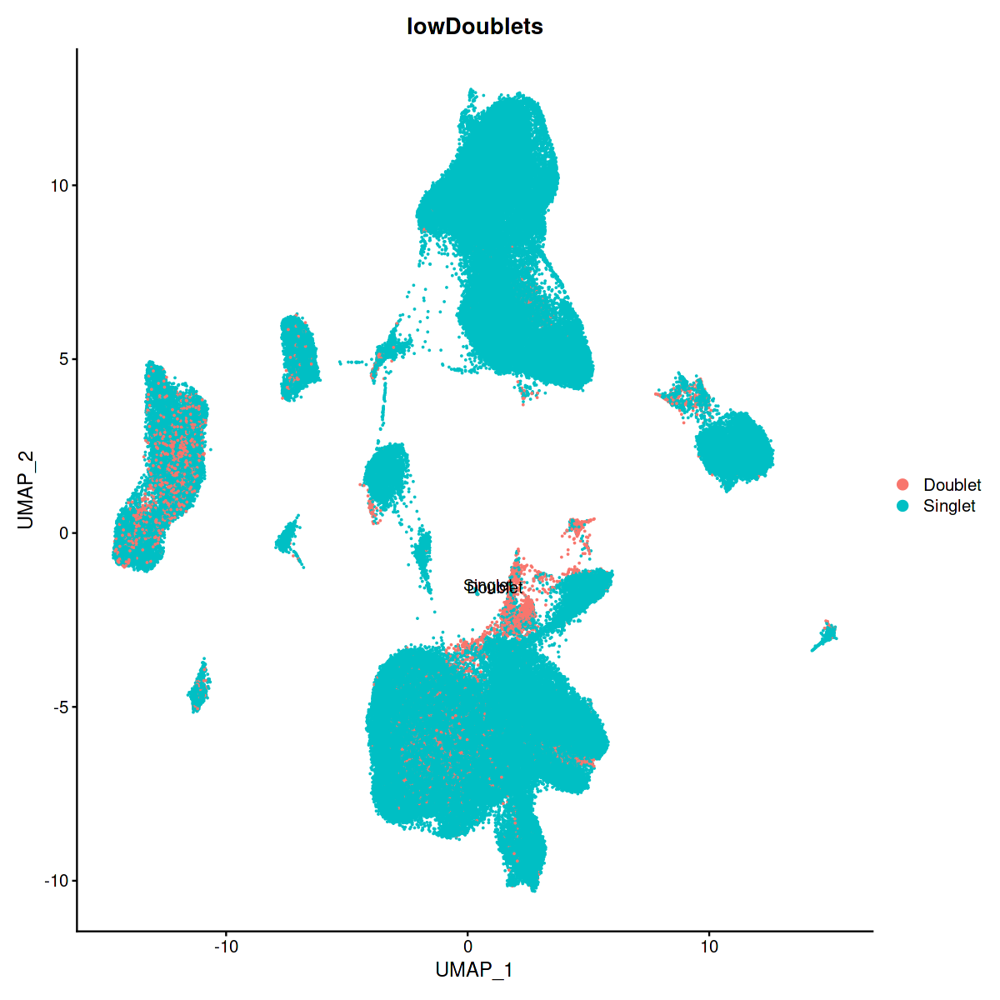

In [40]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE, group.by="lowDoublets")

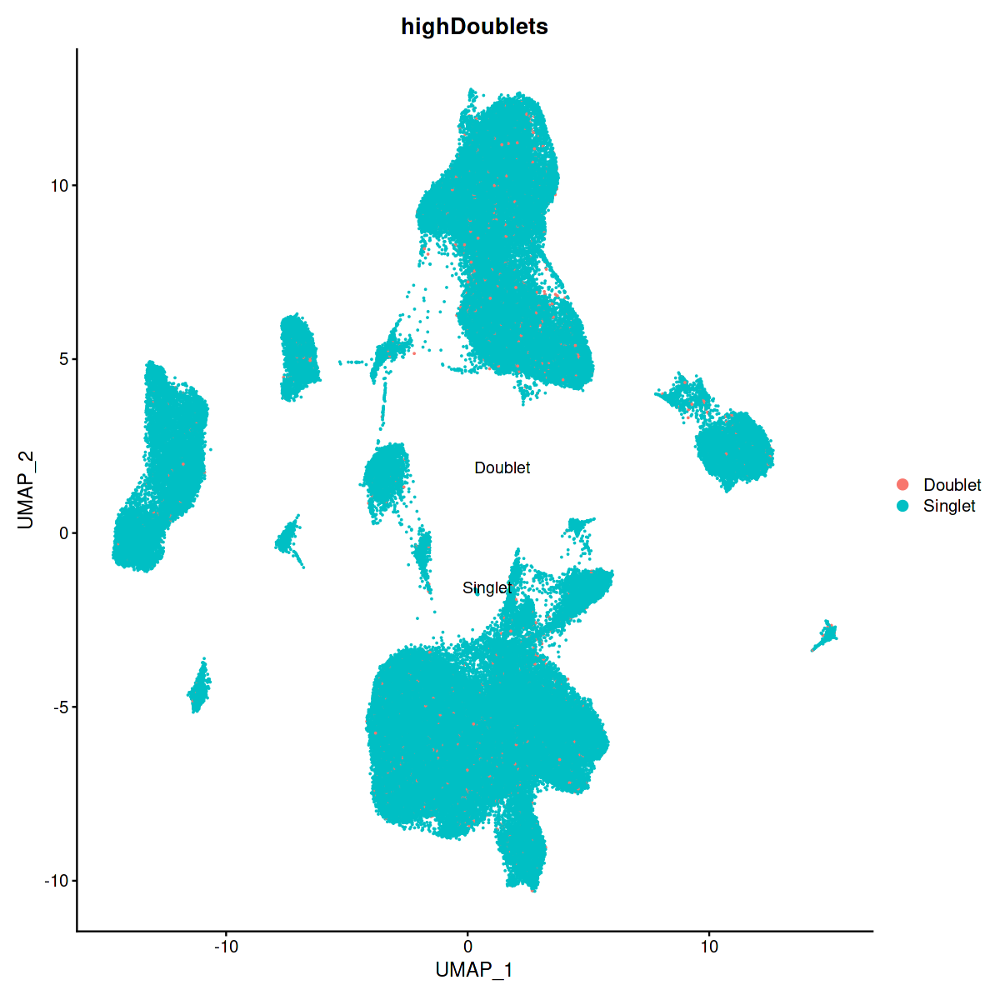

In [41]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE, group.by="highDoublets")

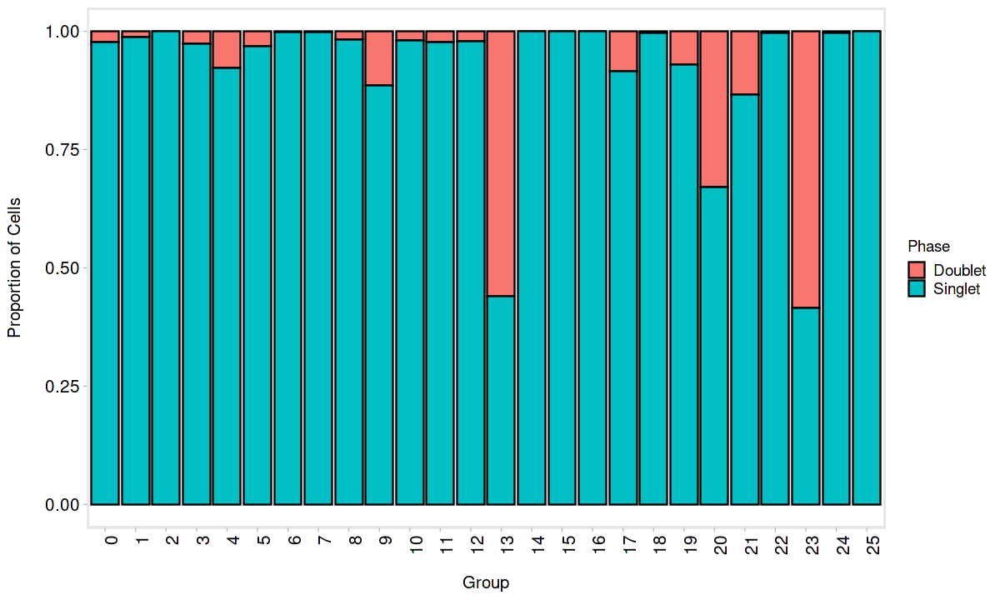

In [42]:
options(repr.plot.width=10, repr.plot.height=6)
freq_table_group <- as.data.frame(prop.table(x = table(syno$lowDoublets, syno$seurat_clusters), margin = 2))
ggplot(data=freq_table_group, aes(x=freq_table_group$Var2, y=freq_table_group$Freq, fill=freq_table_group$Var1)) + theme_powerpoint() +
  geom_bar(stat="identity", color="black") + labs(x="Group", y="Proportion of Cells", fill="Phase") + theme(strip.text = element_text(size = 15, face="bold"), strip.background = element_rect(), axis.text.x=element_text(angle=90, hjust=1)) 

In [43]:
syno

An object of class Seurat 
19143 features across 155662 samples within 1 assay 
Active assay: RNA (19143 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [44]:
##Remove any cluster more than 25% doublets (~4K cells)
syno <- subset(syno, idents=c("13","20","23"), invert=TRUE)

In [45]:
syno

An object of class Seurat 
19143 features across 151871 samples within 1 assay 
Active assay: RNA (19143 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [46]:
#Remove any remaining cells marked as doublets (~3K cells)
syno <- subset(syno, subset = lowDoublets == "Doublet", invert=TRUE)

In [47]:
#Remove any remaining cells marked as doublets (~3K cells)
syno <- subset(syno, subset = highDoublets == "Doublet", invert=TRUE)

In [48]:
syno

An object of class Seurat 
19143 features across 144388 samples within 1 assay 
Active assay: RNA (19143 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

# Re-harmonize post doublet removal

In [49]:
#Continue with typical preprocessing pipeline
syno <- FindVariableFeatures(syno, selection.method = "vst", nfeatures = 2000)
syno <- ScaleData(syno)
syno <- RunPCA(syno)

Centering and scaling data matrix

PC_ 1 
Positive:  COL1A2, PLAC9, C1R, LUM, C1S, PCOLCE, COL6A2, MGP, CCDC80, DCN 
	   NNMT, FSTL1, COL3A1, SPARC, COL6A1, CALD1, TIMP3, CLU, EFEMP1, PLA2G2A 
	   COL1A1, BGN, MMP2, DPT, ISLR, PRG4, COL6A3, MXRA8, HTRA1, PPIC 
Negative:  CTSS, CXCR4, LYZ, SAMHD1, LST1, CYBB, MNDA, ITGA4, S100A9, FCN1 
	   SELL, VSIR, POU2F2, PLAC8, LTB, FGR, JAML, MPEG1, NCF2, S100A8 
	   ADA2, CPVL, REL, TRBC2, IL7R, ITGAL, SPN, RAB11FIP1, KLF6, CD2 
PC_ 2 
Positive:  IL32, TRBC2, CD3D, ETS1, LTB, CD2, TRAC, CD3G, CD3E, CD7 
	   CD247, SYNE2, GZMM, TRBC1, GZMA, IL7R, CCL5, NKG7, SPOCK2, CST7 
	   ISG20, IFITM1, BCL11B, CTSW, TCF7, IKZF3, LINC00861, KLRB1, SAMD3, HOPX 
Negative:  CST3, CTSB, FTL, HLA-DRA, FTH1, CD68, HLA-DRB1, CD14, CTSZ, CD74 
	   C1QA, C1QB, RNASE1, GLUL, C1QC, HLA-DPA1, CD163, MAFB, MS4A7, LYZ 
	   TGFBI, HLA-DPB1, VSIG4, MARCO, CYBB, CTSL, SGK1, HLA-DQB1, CTSS, S100A6 
PC_ 3 
Positive:  FCN1, VCAN, MNDA, MEGF9, CSF3R, FGR, MPEG1, CPPED1, VSIR, SERP

In [50]:
#Run UMAP before integration
syno <- RunUMAP(object = syno, reduction = "pca", dims = 1:40)

14:05:08 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:05:08 Read 144388 rows and found 40 numeric columns

14:05:08 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:05:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:05:31 Writing NN index file to temp file /datastore/lucy/tmp//file6766a206bf62e

14:05:31 Searching Annoy index using 1 thread, search_k = 3000

14:06:40 Annoy recall = 100%

14:06:41 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:06:47 Initializing from normalized Lapla

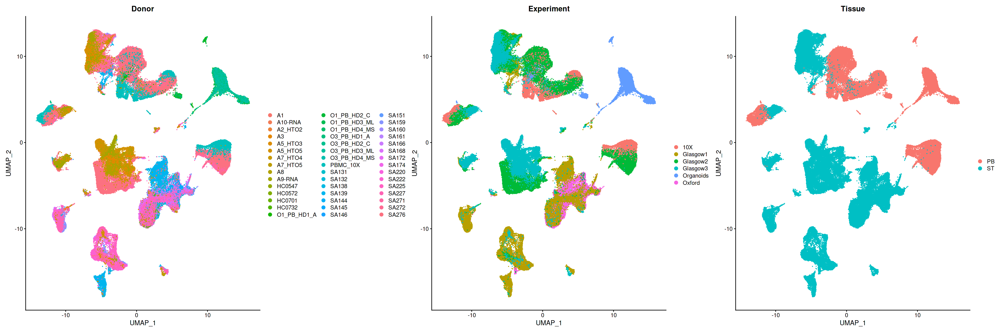

In [51]:
options(repr.plot.width=30, repr.plot.height=10)
DimPlot(syno, raster=FALSE, group.by=c("Donor","Experiment","Tissue"))

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations

14:30:23 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:30:23 Read 144388 rows and found 40 numeric columns

14:30:23 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:30:23 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:30:46 Writing NN index file to temp file /datastore/lucy/tmp//file6766a731217b6

14:30:46 Searching Annoy index using 1 thread, search_k = 3000

14:32:18 Annoy recall = 100%

14:32:19 Commencing smooth kNN di

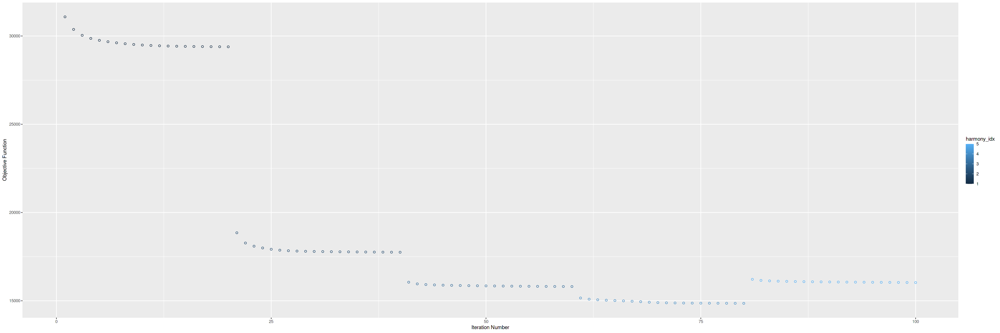

In [52]:
syno <- syno %>% 
    RunHarmony(group.by.vars=c("Donor","Experiment","Tissue","Platform"), plot_convergence = TRUE, theta=c(0,1,0,0))
#Run UMAP and clustering 
syno <- RunUMAP(object = syno, reduction = "harmony", dims = 1:40)

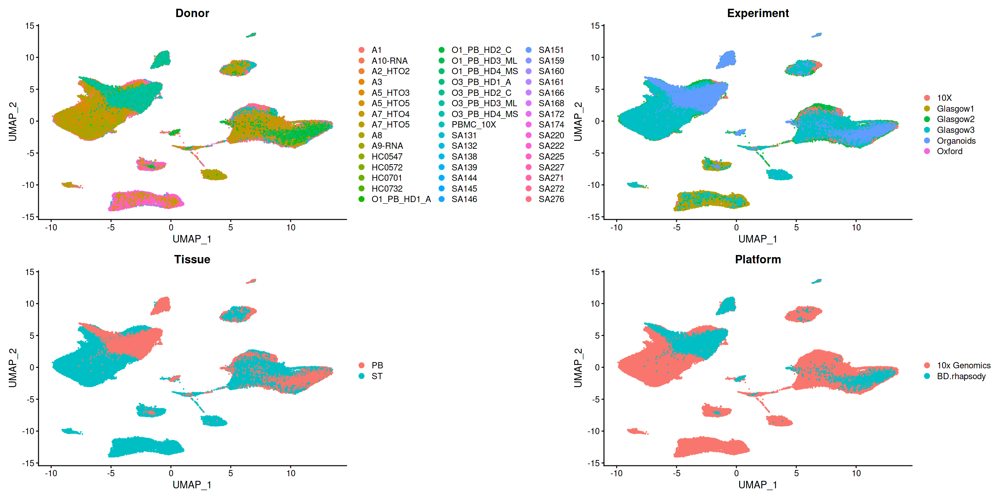

In [60]:
options(repr.plot.width=20, repr.plot.height=10)
DimPlot(syno, raster=FALSE, group.by=c("Donor","Experiment","Tissue", "Platform"))

In [54]:
syno <- FindNeighbors(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindClusters(syno, res=0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 144388
Number of edges: 4688133

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9304
Number of communities: 29
Elapsed time: 168 seconds


8 singletons identified. 21 final clusters.



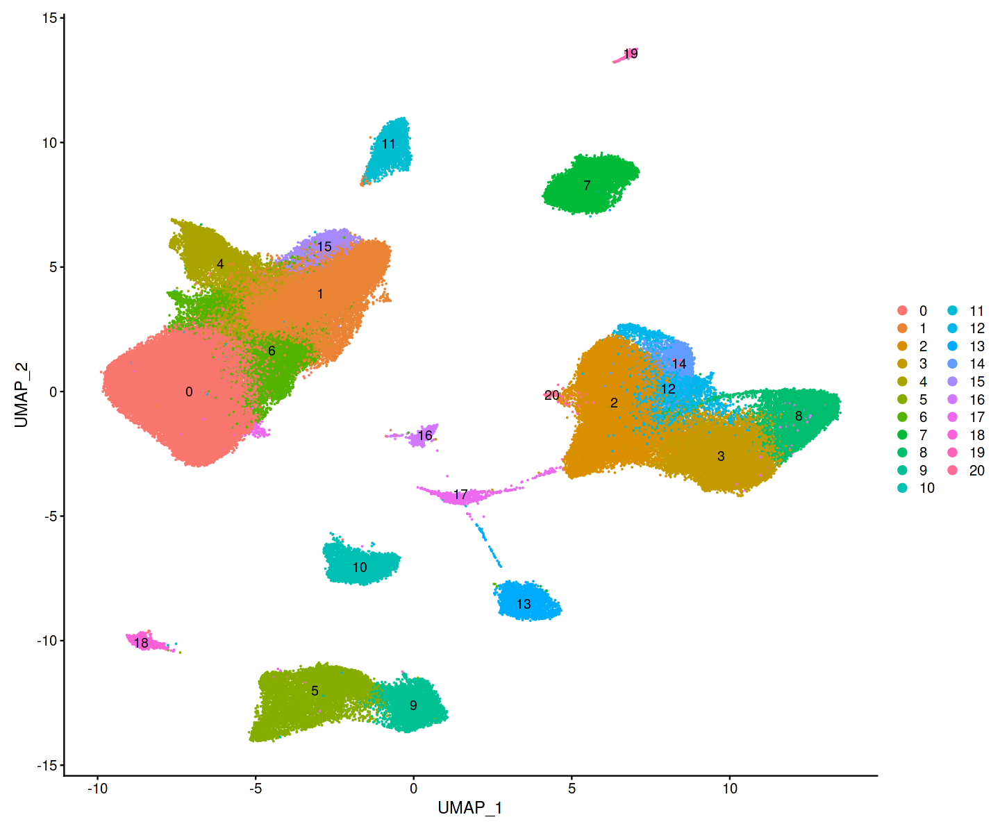

In [55]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

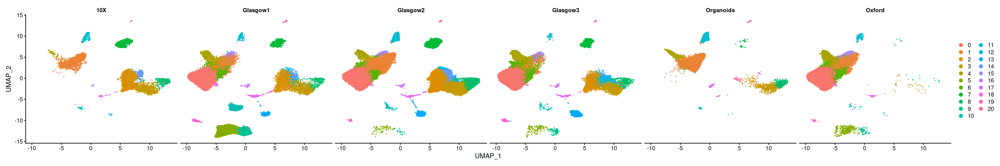

In [56]:
options(repr.plot.width=30, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by=c("Experiment"))

# Identify clusters

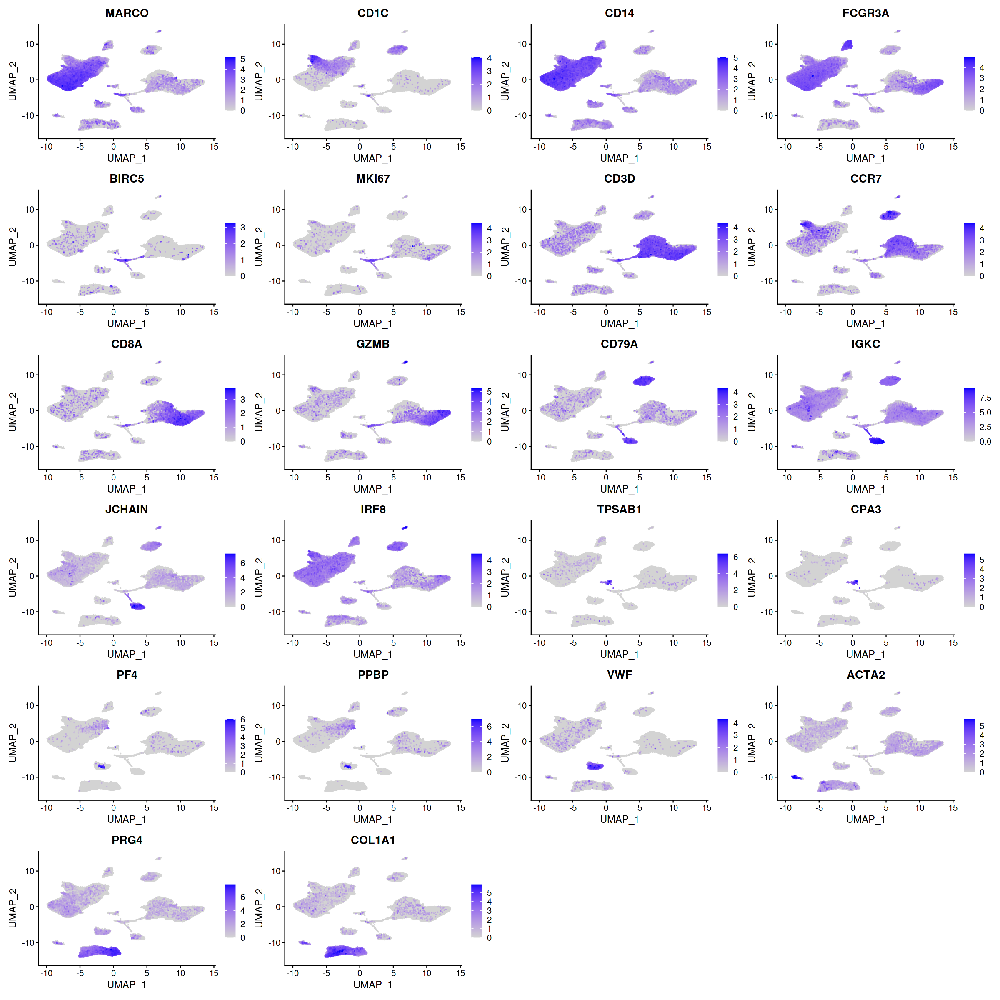

In [57]:
genes=c("MARCO","CD1C","CD14","FCGR3A","BIRC5","MKI67","CD3D","CCR7","CD8A","GZMB","CD79A","IGKC","JCHAIN","IRF8","TPSAB1","CPA3","PF4","PPBP","VWF","ACTA2","PRG4","COL1A1")
options(repr.plot.width=20, repr.plot.height=20)
FeaturePlot(syno, features = unique(genes),order=TRUE, raster=FALSE)

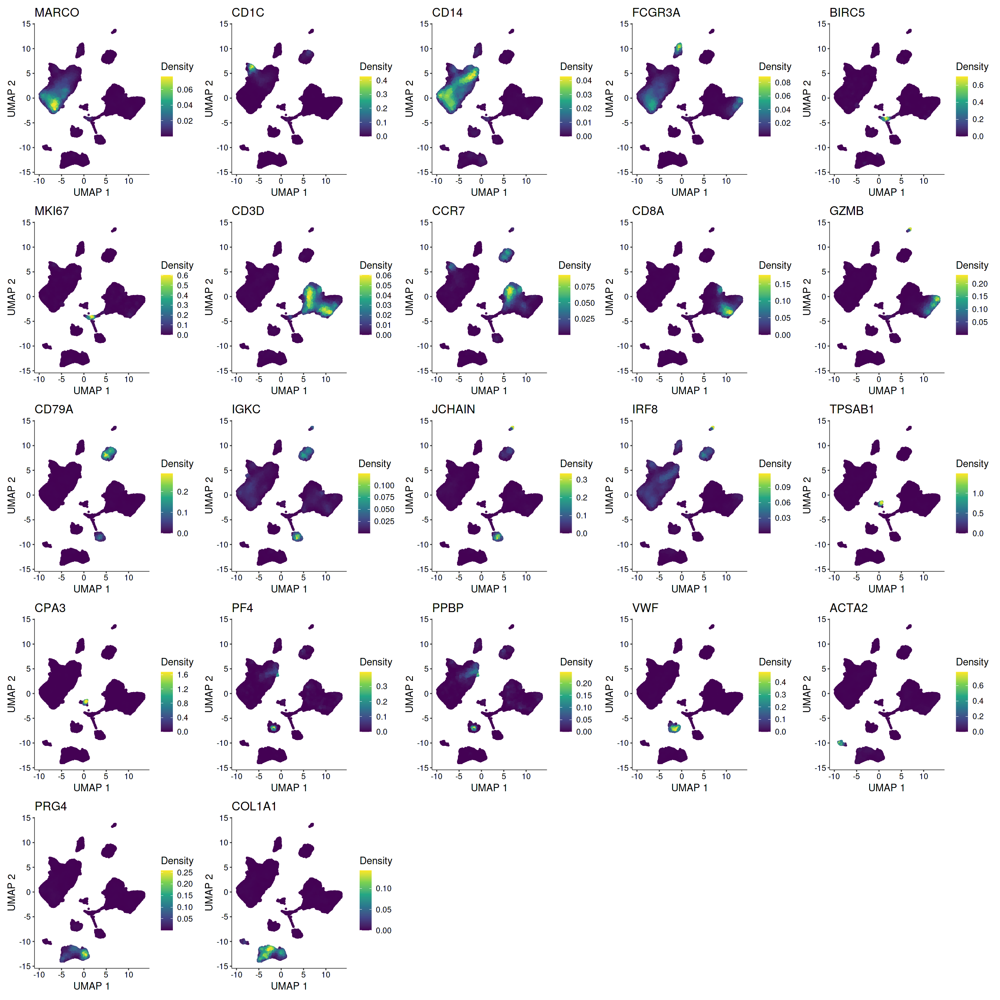

In [58]:
options(repr.plot.width=20, repr.plot.height=20)
plot_density(syno, features=genes, reduction="umap")

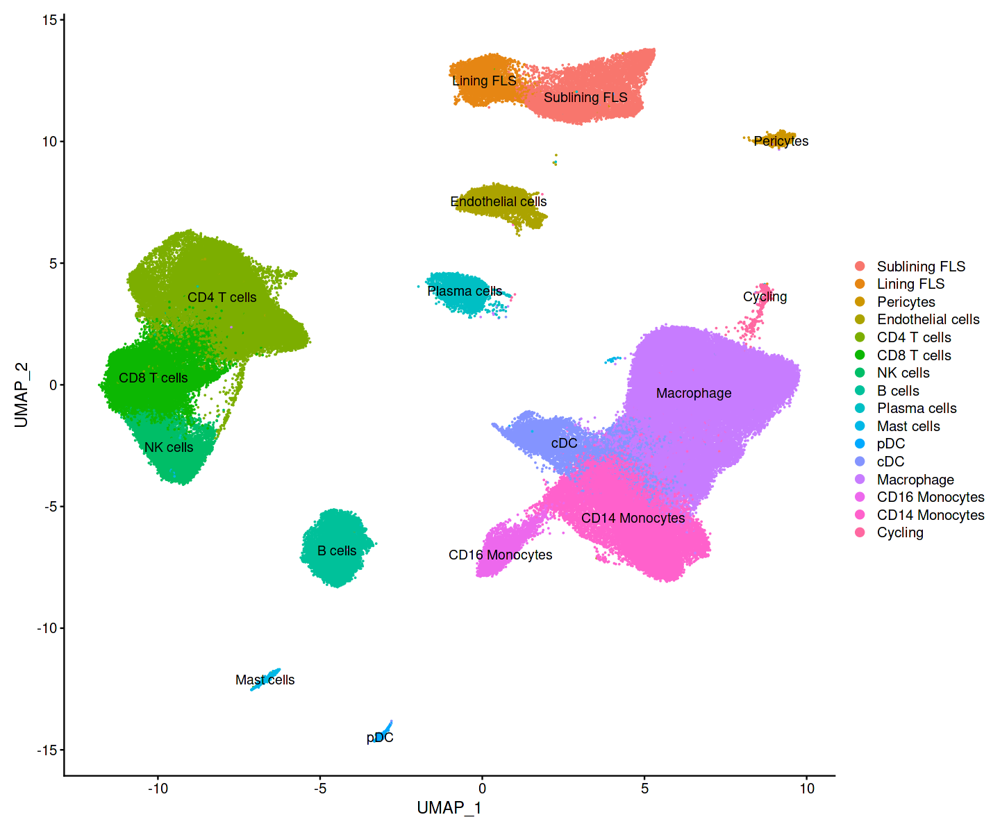

In [4]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

In [64]:
#Rename your clusters by celltype
Idents(syno) <- "seurat_clusters"
syno$celltype <- plyr::revalue(as.character(Idents(syno)),
                                        c("0" = 'Macrophage',"1" = 'CD14 Monocytes',"2" = 'CD4 T cells',
                                          "3" = 'CD8 T cells', "4" = 'cDC',"5" = 'Sublining FLS',"6" = 'Macrophage',
                                          "7" = 'B cells',"8"='NK cells',"9" = 'Lining FLS',"10"='Endothelial cells',"11" = 'CD16 Monocytes',"12" = 'CD4 T cells',"13" = 'Plasma cells', "14" = 'CD4 T cells',
                                          "15" = 'CD14 Monocytes',"16" = 'Mast cells',"17" = 'Cycling',"18" = 'Pericytes',"19" = 'pDC',"20"='CD4 T cells'))

syno$celltype <- as.factor(ordered(syno$celltype, levels=c("Sublining FLS","Lining FLS","Pericytes","Endothelial cells","Platelets","CD4 T cells","CD8 T cells","NK cells","B cells","Plasma cells","Mast cells","pDC","cDC","Macrophage","CD16 Monocytes","CD14 Monocytes","Cycling")))
Idents(syno) <- syno$celltype

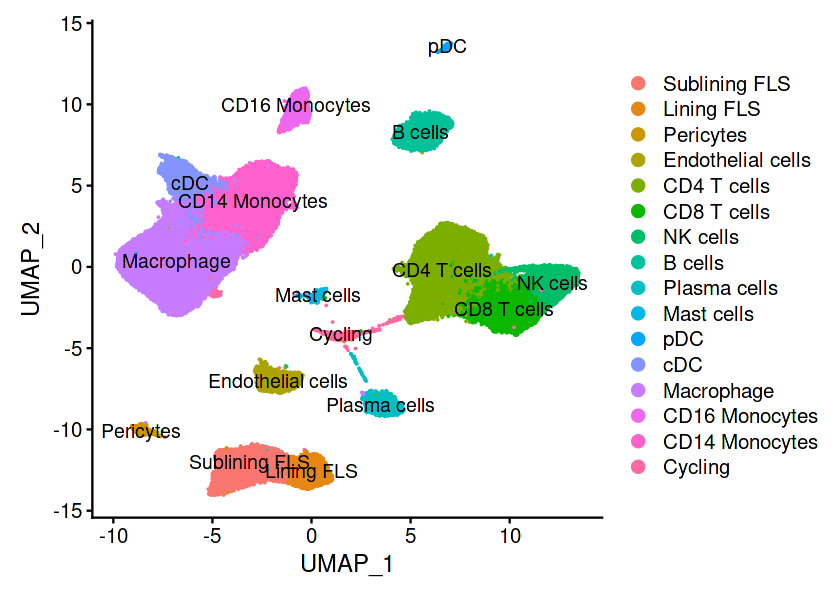

In [65]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(syno, raster=FALSE, label=TRUE)

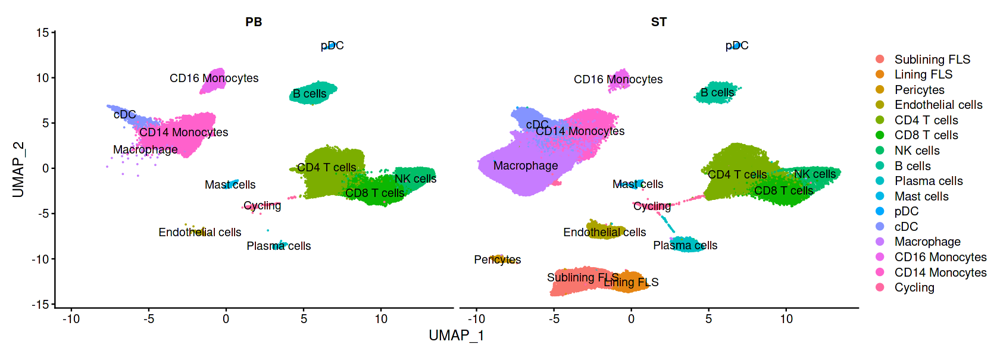

In [66]:
options(repr.plot.width=14, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Tissue",label=TRUE)

In [67]:
cluster.markers <- FindAllMarkers(syno, only.pos=TRUE, test.use="MAST", min.pct=0.4)
cluster.markers <- cluster.markers[which(cluster.markers$p_val_adj<0.05),]

Calculating cluster Sublining FLS


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Com

In [68]:
top5 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)

In [69]:
top20 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC)

In [70]:
top20[top20$cluster=="22",]

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>


In [74]:
syno@misc <- cluster.markers

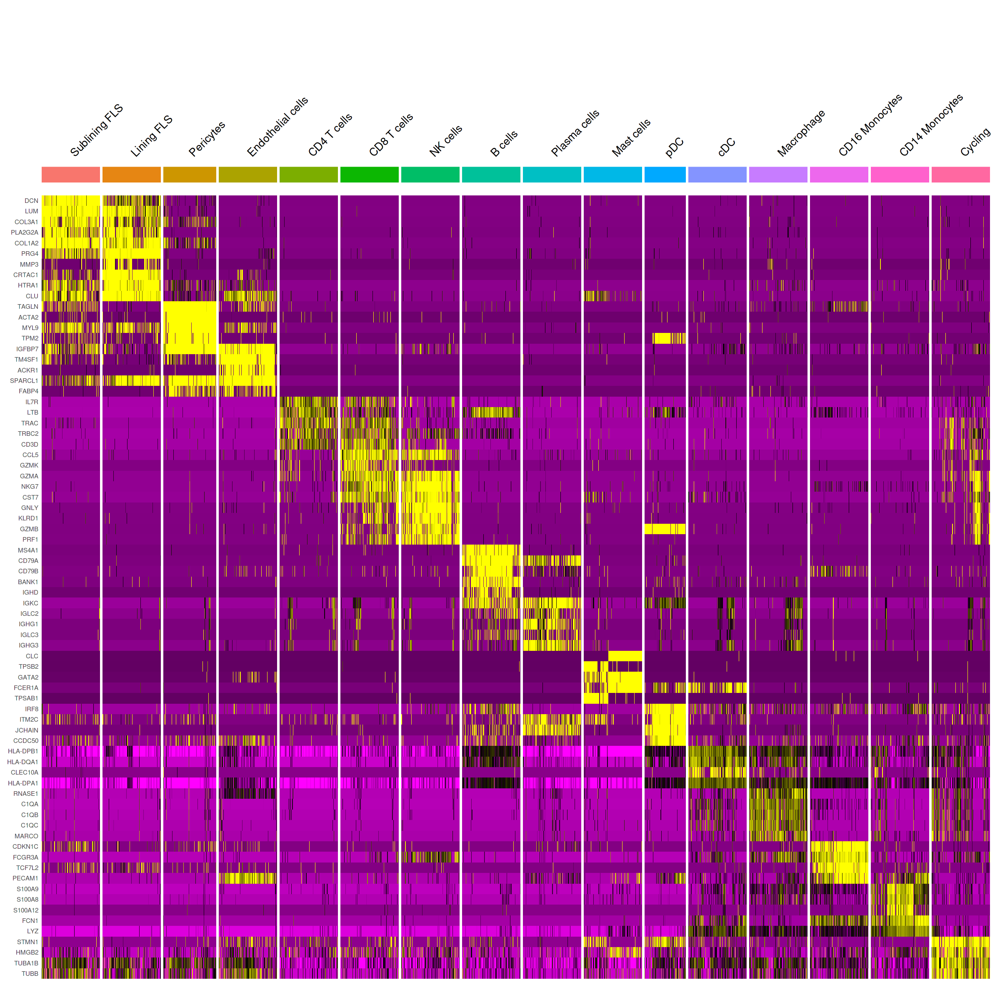

In [71]:
options(repr.plot.width=20, repr.plot.height=20)
DoHeatmap(subset(syno, downsample = 1000), features=unique(top5$gene)) + NoLegend()

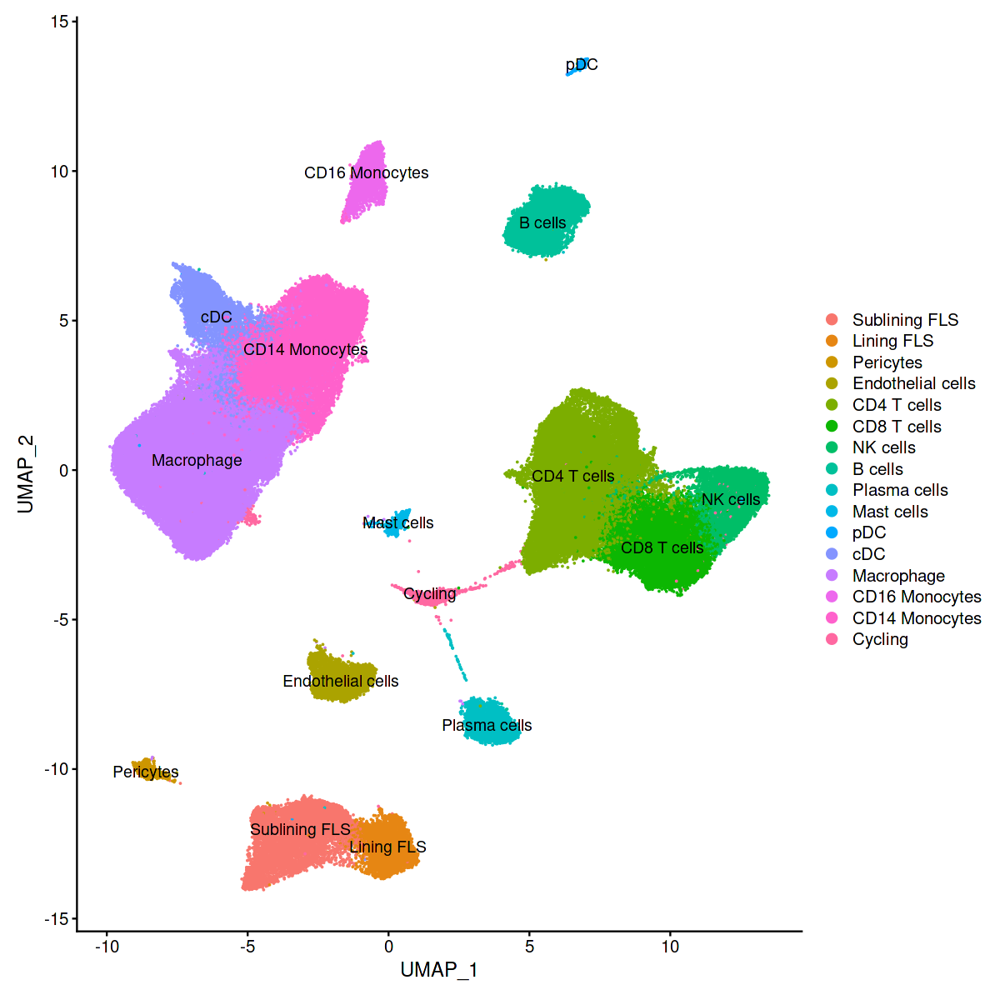

In [72]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

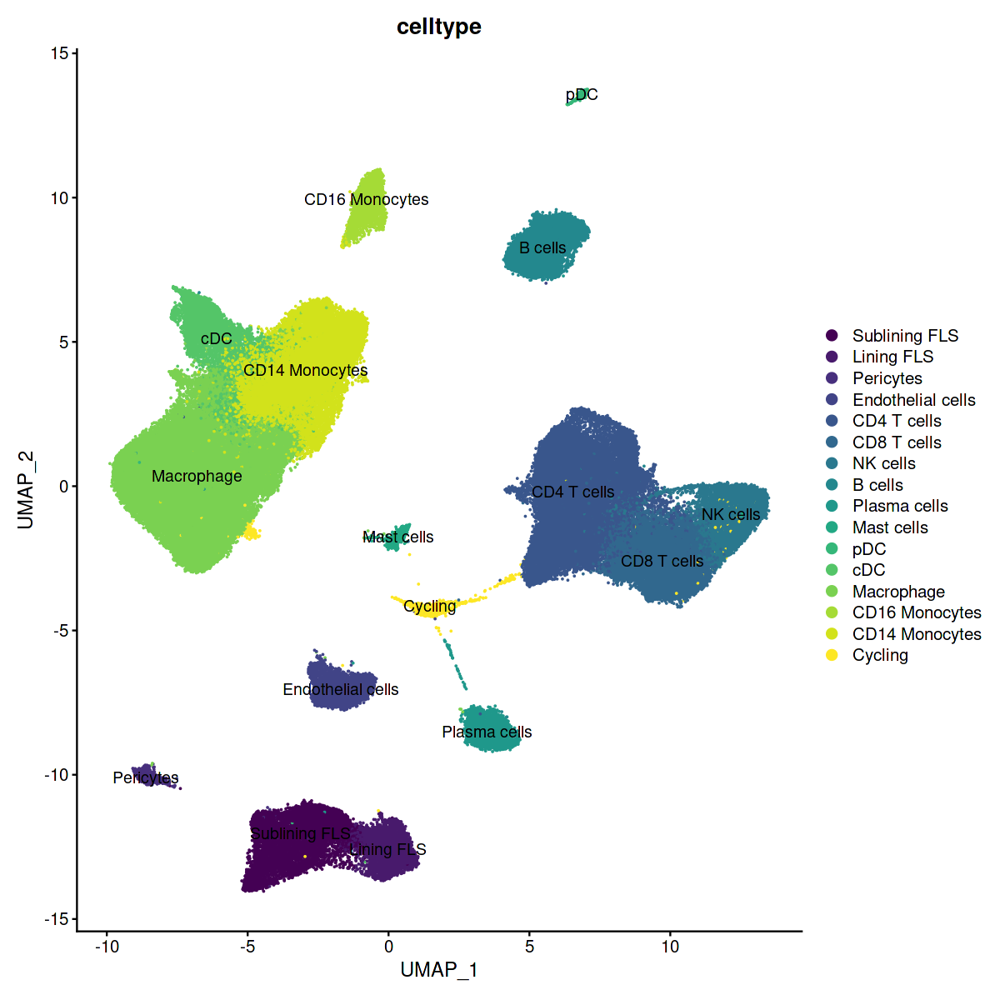

In [73]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, group.by="celltype",raster=FALSE, label=TRUE)

In [75]:
saveRDS(syno, "./cache/syno.rds")

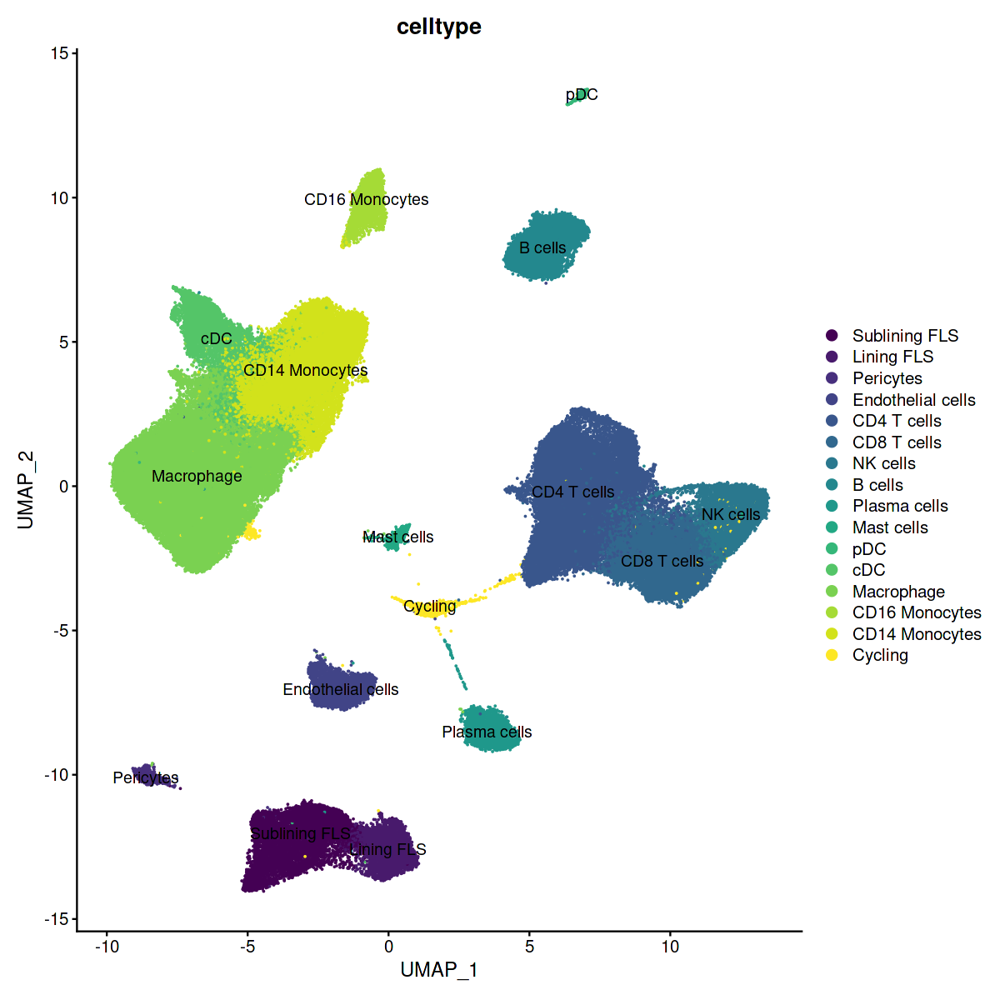

In [76]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, group.by="celltype",raster=FALSE, label=TRUE)

# Closer look at cycling cells

In [77]:
cycling <- subset(syno, idents="Cycling")

In [78]:
#Continue with typical preprocessing pipeline
cycling <- FindVariableFeatures(cycling, selection.method = "vst", nfeatures = 2000)
cycling <- ScaleData(cycling)
cycling <- RunPCA(cycling)

Centering and scaling data matrix

PC_ 1 
Positive:  GZMA, NKG7, CD52, IL32, ETS1, CST7, CD247, TRBC2, CD2, C12orf75 
	   CD7, CTSW, CD3D, CCL5, LCK, CD3E, LIMD2, SYNE2, GZMM, PRF1 
	   HOPX, GNLY, KLRD1, TRAC, TBC1D10C, GZMB, SAMD3, SPN, PYHIN1, SH2D1A 
Negative:  NPC2, AIF1, CST3, PSAP, GRN, C1QA, RNASE1, CTSB, FTL, CD68 
	   CTSZ, C1QB, C1QC, TGFBI, MS4A6A, CD14, MARCO, FCGRT, LYZ, GLUL 
	   HLA-DRA, CTSL, CYBB, HLA-DRB1, GPNMB, MS4A4A, FN1, VSIG4, MAFB, MARCKS 
PC_ 2 
Positive:  RPS17, ALDOA, GPX1, MT2A, MT1X, MT1E, MT1G, CD74, HLA-DRB5, IL32 
	   SCO2, HLA-DQA2, MMP3, TRAC, FTH1, CD3D, HLA-DPB1, SDS, MT1H, HMOX1 
	   LAG3, CXCL13, IFI27, MMP1, GREM1, MT1M, HLA-DQB1, PSAT1, HLA-DRA, CKS2 
Negative:  ATP5F1E, RACK1, ATP5MG, ELOB, ATP5MF, ATP5MC2, ATP5ME, SEM1, ATP5F1D, TRIR 
	   ATP5MC3, ATP5F1B, ATP5PF, ATP5IF1, ATP5PO, ATP5PD, ATP5F1C, ATP5F1A, ATP5PB, REX1BD 
	   SELENOK, SELENOW, ELOC, PCLAF, SELENOH, MT-ATP6, JPT1, RTRAF, SELENOS, SELENOT 
PC_ 3 
Positive:  RGCC, DUSP4, CXCR4, 

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10

13:04:40 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:04:40 Read 1064 rows and found 40 numeric columns

13:04:40 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:04:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:04:40 Writing NN index file to temp file /datastore/lucy/tmp//file6766a5e9c60ed

13:04:40 Searching Annoy index using 1 thread, search_k = 3000

13:04:41 Annoy recall = 100%

13

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1064
Number of edges: 46566

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8436
Number of communities: 9
Elapsed time: 0 seconds


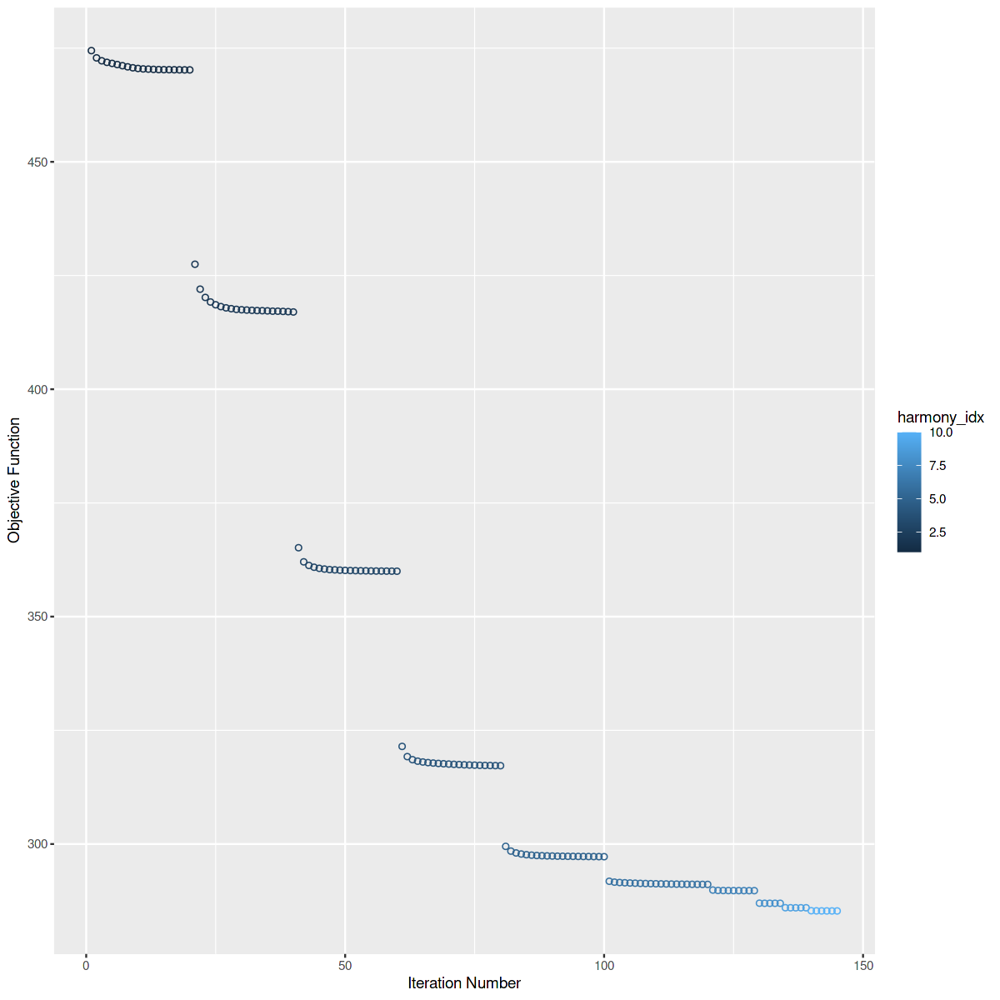

In [79]:
cycling <- cycling %>% 
RunHarmony(group.by.vars=c("Donor","Experiment","Tissue","Platform"), plot_convergence = TRUE, theta=c(0,1,0,0))
#Run UMAP and clustering #
cycling <- RunUMAP(object = cycling, reduction = "harmony", dims = 1:40)
cycling <- FindNeighbors(object = cycling, reduction = "harmony", dims = 1:40)
cycling <- FindClusters(cycling, res=0.6)

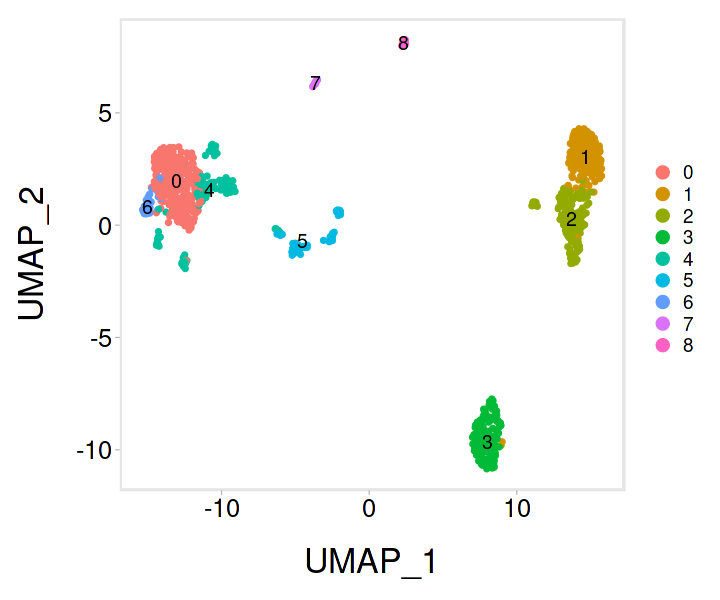

In [80]:
options(repr.plot.width=6, repr.plot.height=5)
UMAPPlot(cycling, pt.size=1, label=TRUE) + theme_powerpoint( )+ theme(axis.text=element_text(size=15),axis.title=element_text(size=20))

In [81]:
cycling.cluster.markers <- FindAllMarkers(cycling, only.pos=TRUE, test.use="MAST", min.pct=0.4)

Calculating cluster 0


 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [====

In [82]:
cycling.cluster.markers <- cycling.cluster.markers[which(cycling.cluster.markers$p_val_adj<0.05),]
top10 <- cycling.cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 10, order_by = avg_log2FC)

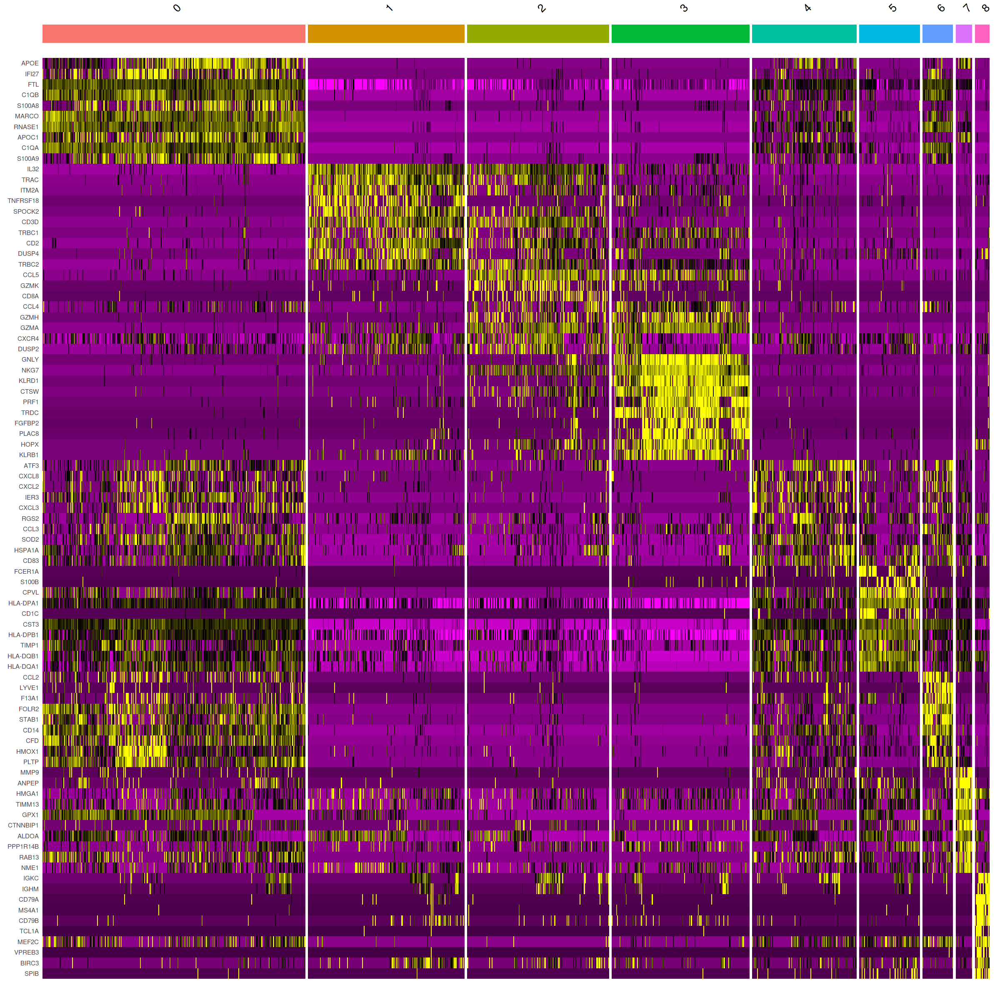

In [83]:
options(repr.plot.width=20, repr.plot.height=20)
DoHeatmap(cycling, features=unique(top10$gene)) + NoLegend()

In [84]:
#Which cluster sof cycling cells are not of myeloid orgigin? We are not interested
to.remove <- subset(cycling, idents=c("1","2","3","7","8"))

In [85]:
#Remove cycling cells identified as not of myeloid origin
syno <- subset(syno, cells=Cells(to.remove), invert=TRUE)

# Re-harmonize after keeping only myeloid cycling

In [86]:
#Continue with typical preprocessing pipeline
syno <- FindVariableFeatures(syno, selection.method = "vst", nfeatures = 2000)
syno <- ScaleData(syno)
syno <- RunPCA(syno)

Centering and scaling data matrix

PC_ 1 
Positive:  COL1A2, PLAC9, C1R, LUM, C1S, PCOLCE, COL6A2, MGP, CCDC80, DCN 
	   NNMT, FSTL1, COL3A1, SPARC, COL6A1, CALD1, TIMP3, CLU, EFEMP1, PLA2G2A 
	   COL1A1, BGN, MMP2, DPT, ISLR, PRG4, COL6A3, MXRA8, HTRA1, PPIC 
Negative:  CTSS, LYZ, CXCR4, SAMHD1, LST1, CYBB, MNDA, S100A9, FCN1, ITGA4 
	   VSIR, POU2F2, SELL, FGR, JAML, PLAC8, MPEG1, NCF2, LTB, S100A8 
	   ADA2, CPVL, LYN, HLA-DPA1, REL, KLF6, RAB11FIP1, HLA-DRA, SERPINA1, ITGAL 
PC_ 2 
Positive:  CST3, CTSB, FTL, HLA-DRA, FTH1, CD68, HLA-DRB1, CD14, CTSZ, CD74 
	   C1QA, C1QB, GLUL, RNASE1, C1QC, HLA-DPA1, CD163, MAFB, LYZ, MS4A7 
	   TGFBI, HLA-DPB1, VSIG4, CYBB, MARCO, CTSL, SGK1, CTSS, S100A6, HLA-DQB1 
Negative:  IL32, TRBC2, CD3D, ETS1, LTB, CD2, TRAC, CD3G, CD3E, CD7 
	   CD247, SYNE2, GZMM, TRBC1, GZMA, IL7R, CCL5, SPOCK2, NKG7, CST7 
	   ISG20, IFITM1, BCL11B, CTSW, TCF7, IKZF3, LINC00861, KLRB1, SAMD3, HOPX 
PC_ 3 
Positive:  FCN1, VCAN, MNDA, MEGF9, CSF3R, FGR, MPEG1, CPPED1,

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations

13:32:03 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:32:03 Read 143851 rows and found 40 numeric columns

13:32:03 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:32:03 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:32:26 Writing NN index file to temp file /datastore/lucy/tmp//file6766a19da417f

13:32:27 Searching Annoy index using 1 thread, search_k = 3000

13:33:58 Annoy recall = 100%

13:33:58 Commencing smooth kNN di

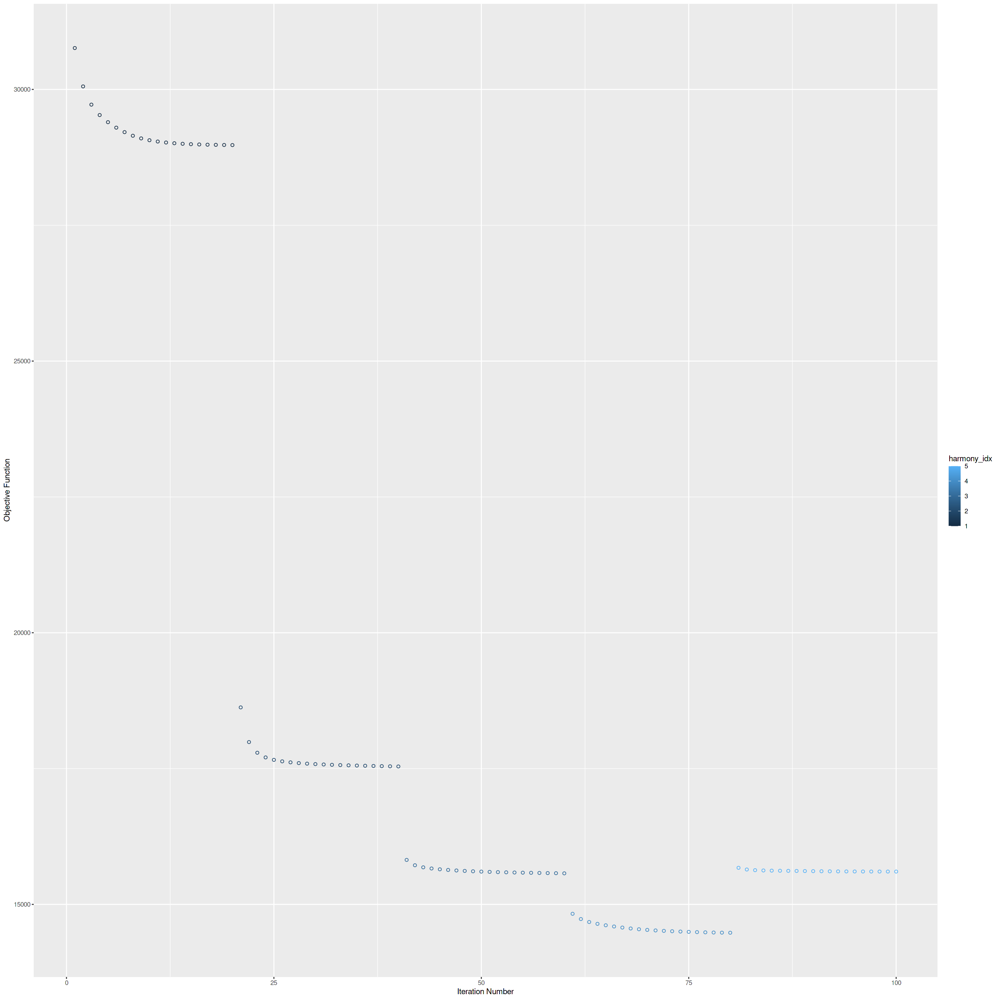

In [87]:
syno <- syno %>% 
    RunHarmony(group.by.vars=c("Donor","Experiment","Tissue","Platform"), plot_convergence = TRUE, theta=c(0,1,0,0))
#Run UMAP and clustering 
syno <- RunUMAP(object = syno, reduction = "harmony", dims = 1:40)

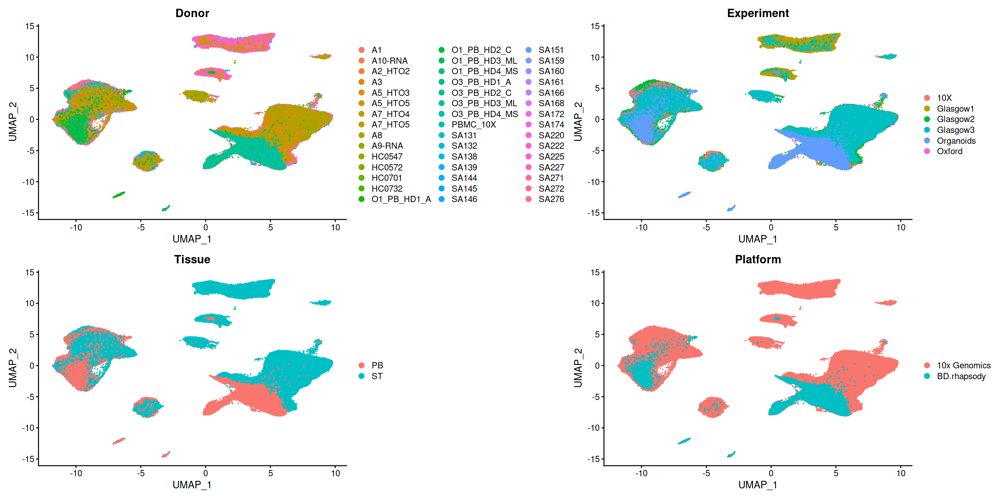

In [88]:
options(repr.plot.width=20, repr.plot.height=10)
DimPlot(syno, raster=FALSE, group.by=c("Donor","Experiment","Tissue", "Platform"))

In [89]:
syno <- FindNeighbors(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindClusters(syno, res=0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 143851
Number of edges: 4658593

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9300
Number of communities: 24
Elapsed time: 167 seconds


3 singletons identified. 21 final clusters.



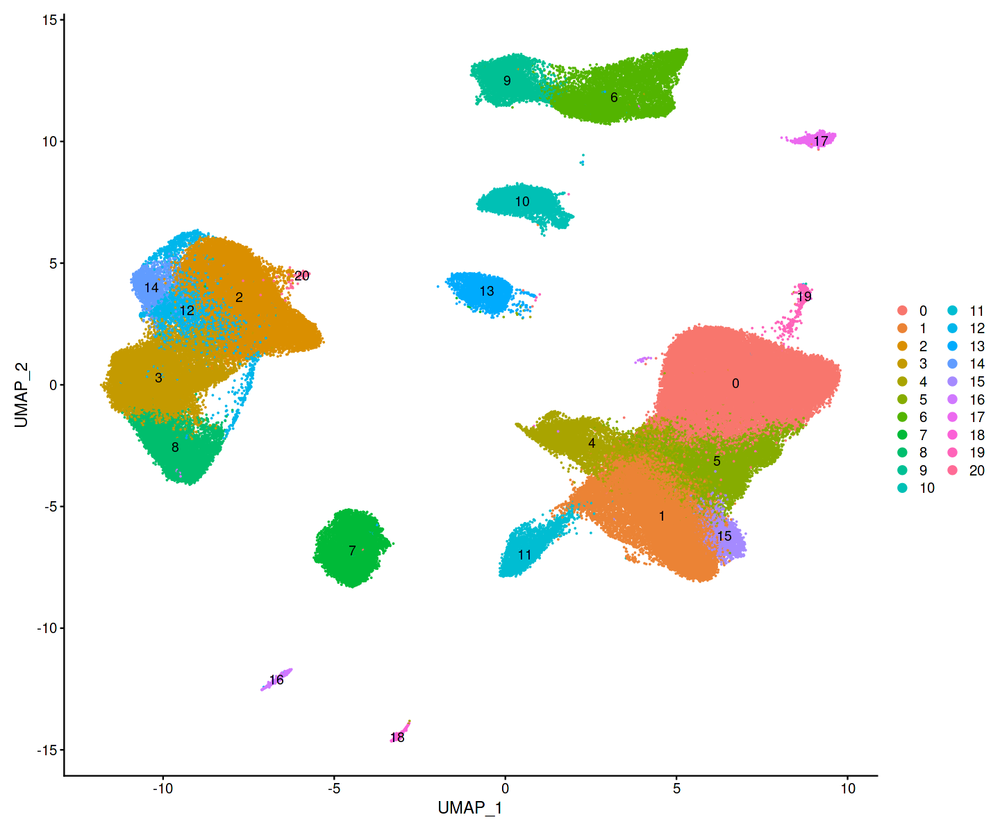

In [90]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

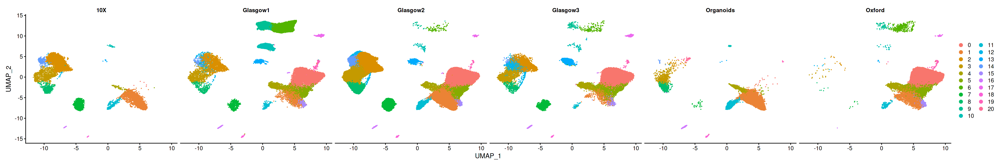

In [91]:
options(repr.plot.width=30, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by=c("Experiment"))

# Identify clusters

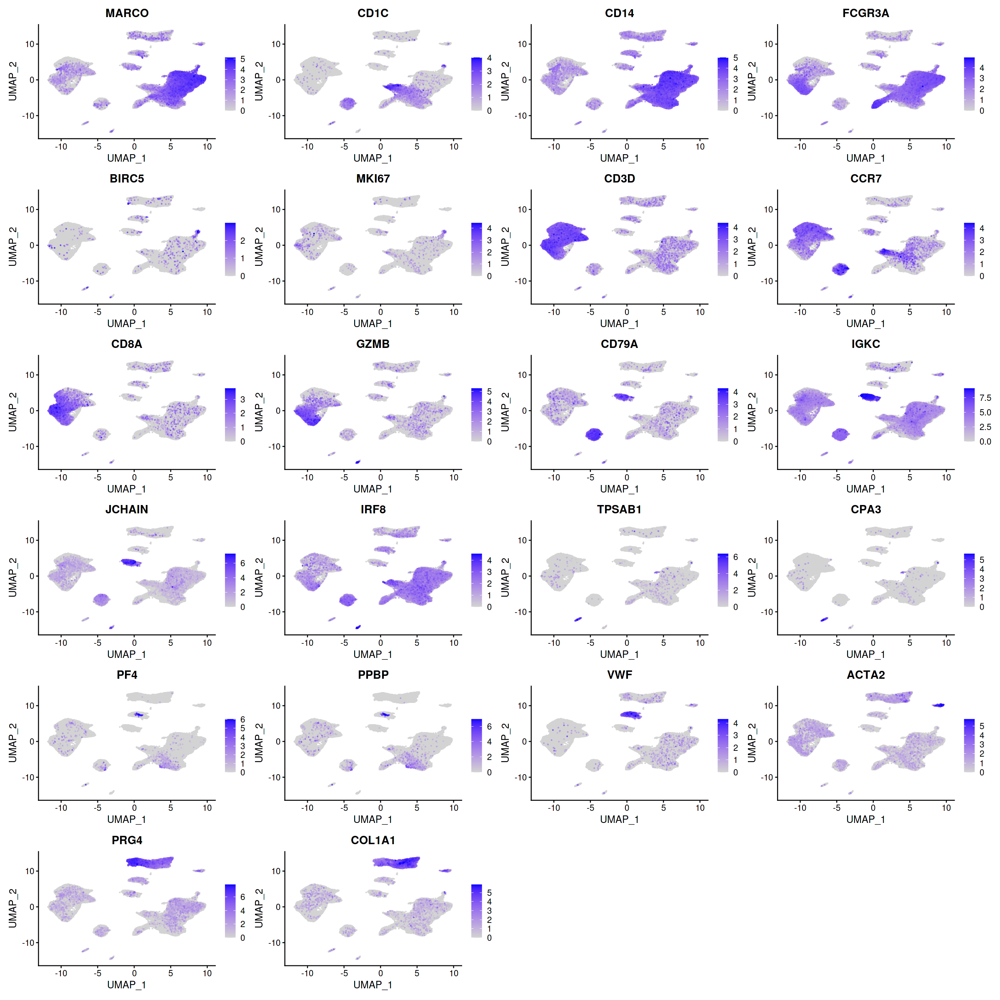

In [92]:
genes=c("MARCO","CD1C","CD14","FCGR3A","BIRC5","MKI67","CD3D","CCR7","CD8A","GZMB","CD79A","IGKC","JCHAIN","IRF8","TPSAB1","CPA3","PF4","PPBP","VWF","ACTA2","PRG4","COL1A1")
options(repr.plot.width=20, repr.plot.height=20)
FeaturePlot(syno, features = unique(genes),order=TRUE, raster=FALSE)

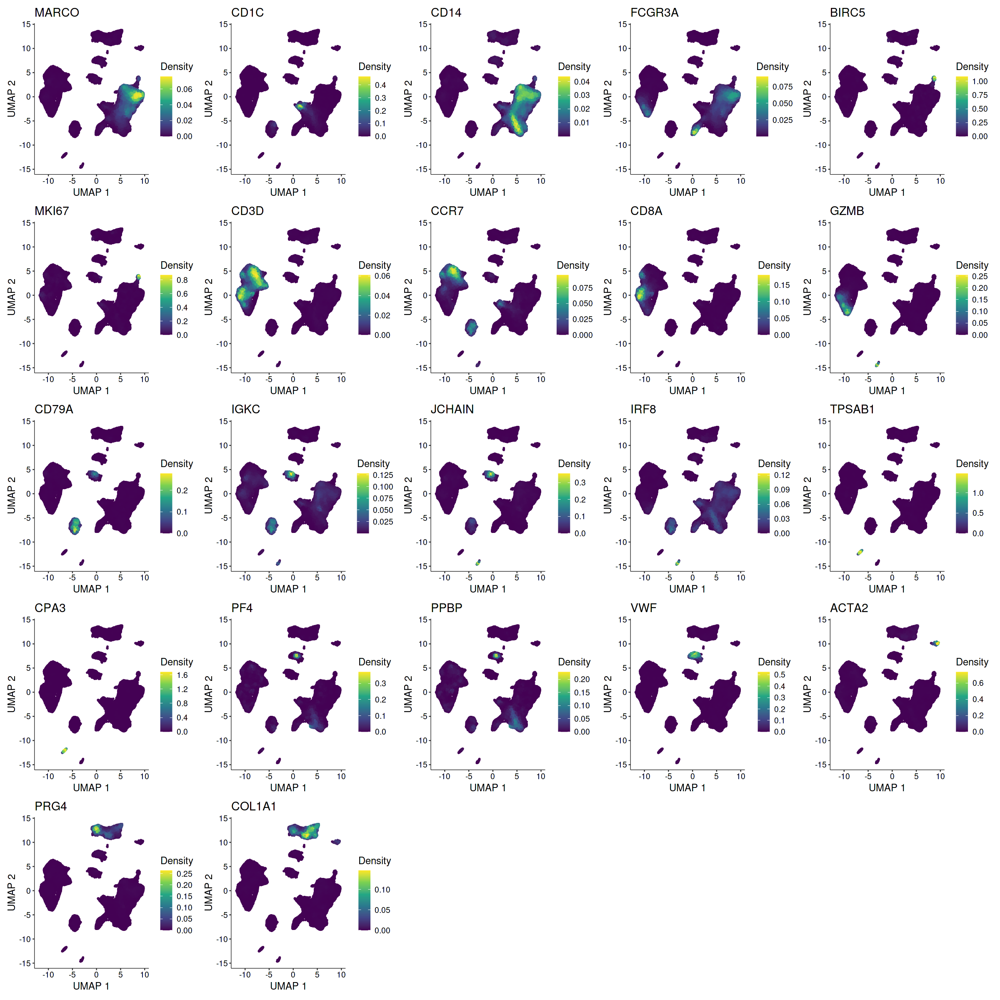

In [93]:
options(repr.plot.width=20, repr.plot.height=20)
plot_density(syno, features=genes, reduction="umap")

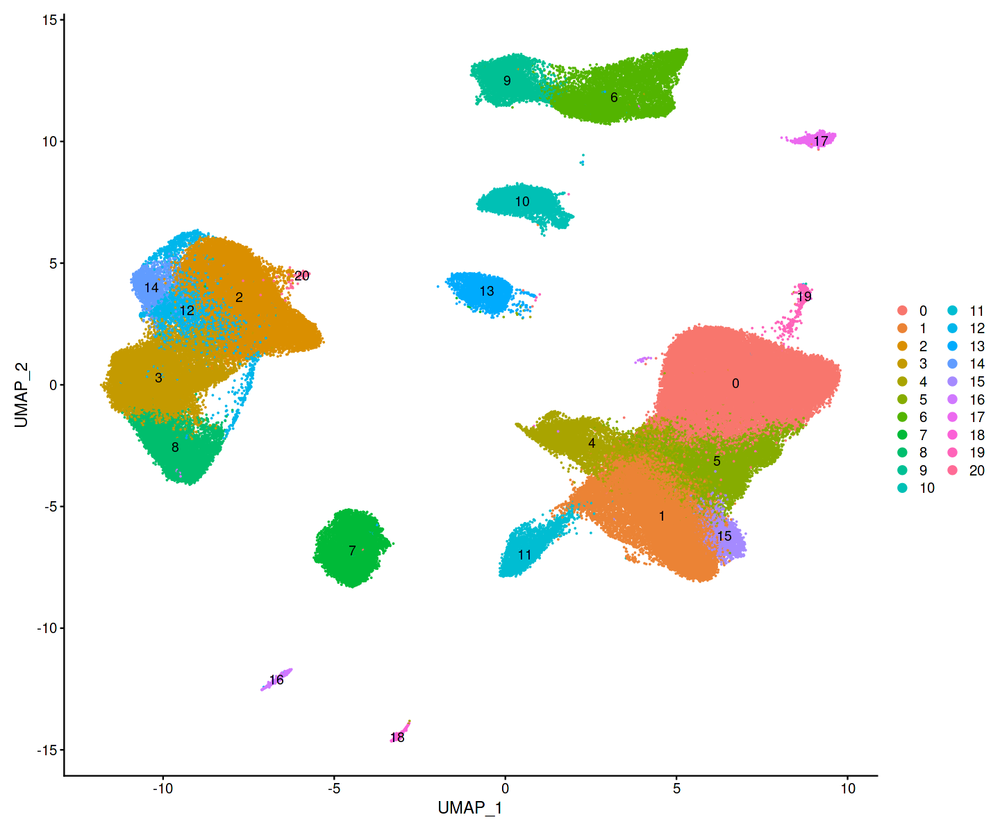

In [94]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

In [95]:
#Rename your clusters by celltype
Idents(syno) <- "seurat_clusters"
syno$celltype <- plyr::revalue(as.character(Idents(syno)),
                                        c("0" = 'Macrophage',"1" = 'CD14 Monocytes',"2" = 'CD4 T cells',
                                          "3" = 'CD8 T cells', "4" = 'cDC',"5" = 'Macrophage',"6" = 'Sublining FLS',
                                          "7" = 'B cells',"8"='NK cells',"9" = 'Lining FLS',"10"='Endothelial cells',"11" = 'CD16 Monocytes',"12" = 'CD4 T cells',"13" = 'Plasma cells', "14" = 'CD4 T cells',
                                          "15" = 'CD14 Monocytes',"16" = 'Mast cells',"17" = 'Pericytes',"18" = 'pDC',"19" = 'Cycling',"20"='CD4 T cells'))

syno$celltype <- as.factor(ordered(syno$celltype, levels=c("Sublining FLS","Lining FLS","Pericytes","Endothelial cells","Platelets","CD4 T cells","CD8 T cells","NK cells","B cells","Plasma cells","Mast cells","pDC","cDC","Macrophage","CD16 Monocytes","CD14 Monocytes","Cycling")))
Idents(syno) <- syno$celltype

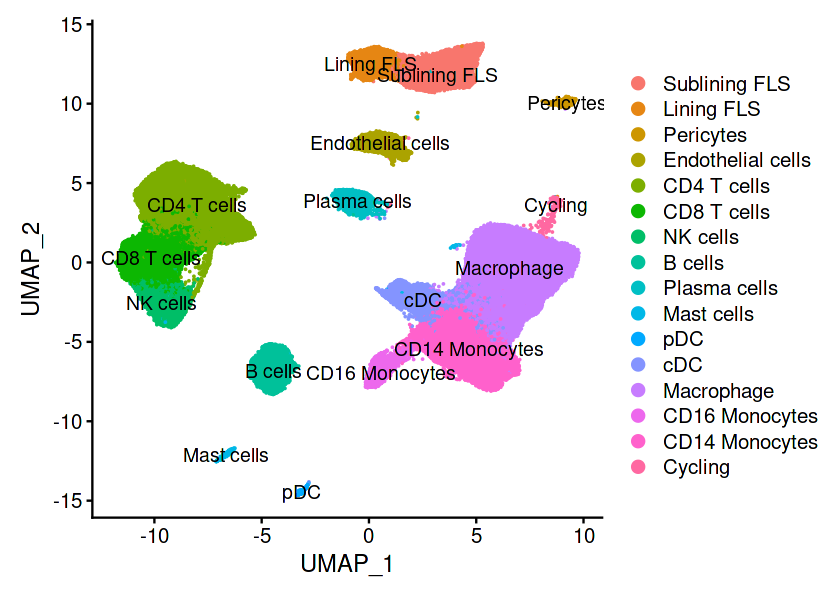

In [96]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(syno, raster=FALSE, label=TRUE)

In [1]:
options(repr.plot.width=14, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Tissue",label=FALSE)

ERROR: Error in DimPlot(syno, raster = FALSE, split.by = "Tissue", label = FALSE): could not find function "DimPlot"


# Find cluster markers

In [3]:
cluster.markers <- FindAllMarkers(syno, only.pos=TRUE, test.use="MAST", min.pct=0.4)
cluster.markers <- cluster.markers[which(cluster.markers$p_val_adj<0.05),]

Calculating cluster Sublining FLS


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Com

In [4]:
top5 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)

In [5]:
top20 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC)

In [6]:
top20[top20$cluster=="22",]

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>


In [7]:
syno@misc <- cluster.markers

In [12]:
cluster.markers <- syno@misc

# Make scaled expression heatmap of top 5 markers

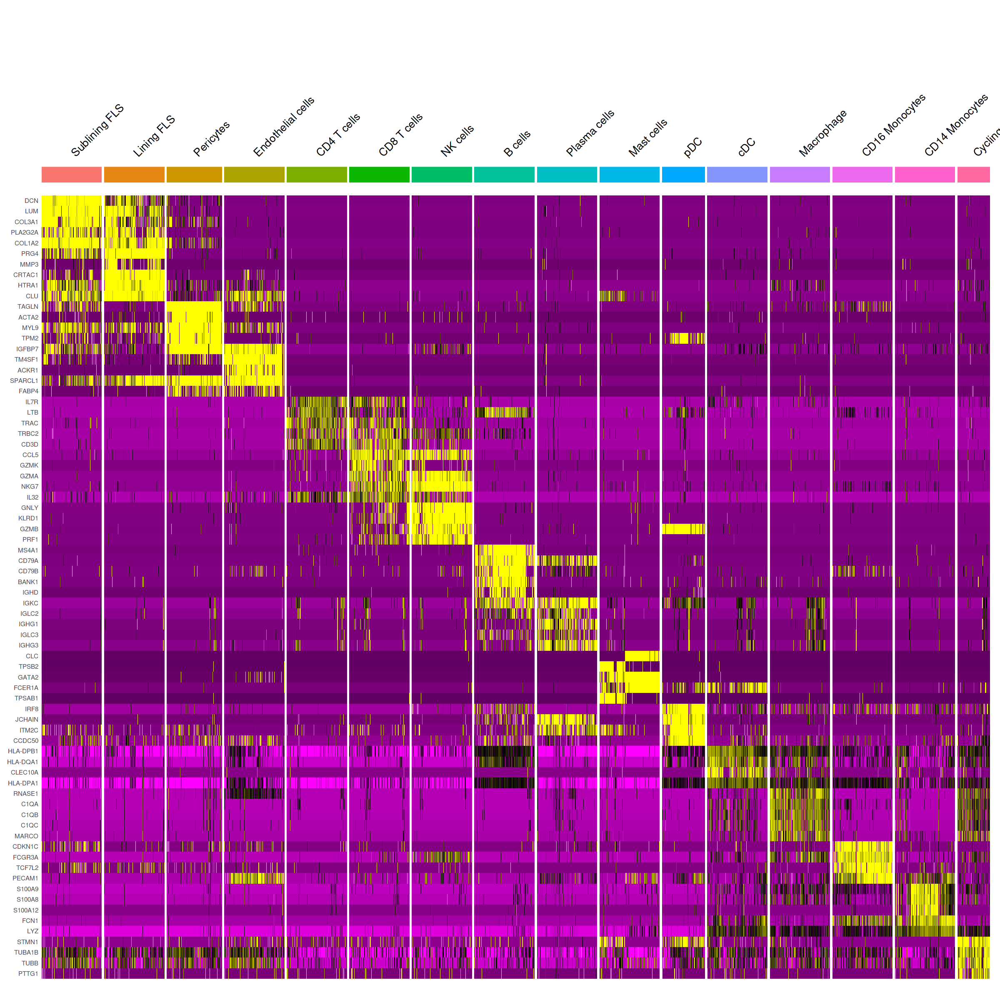

In [8]:
options(repr.plot.width=20, repr.plot.height=20)
DoHeatmap(subset(syno, downsample = 1000), features=unique(top5$gene)) + NoLegend()

In [16]:
cluster.markers <- as.data.frame(cluster.markers)

# Make AvgLogFC heatmap of top 5 markers

In [17]:
library(data.table)
# pick signficant genes to show in the heatmap
# arrange the genes such that the gene with max logFC is at the center and values decrease as we move away from center
genes_use_df<-data.table(cluster.markers)[
    p_val_adj<0.05][
    , .SD[order(-avg_log2FC)][1:20, ], by = cluster][
    , .SD[!is.na(gene)]][
    , .SD[order(avg_log2FC)], by = cluster][
    , ":=" (len = .N, rank = frank(avg_log2FC)), by = cluster][
    , .SD[c(seq(1, round(.SD$len[1]/3), 1), seq(.SD$len[1], round(.SD$len[1]/3)+1, -1)), ], by = cluster][
    , .(gene, avg_log2FC, cluster, p_val_adj) 
]


In [18]:
#Organise genes we want to include by cluster
genes_use_df <- genes_use_df %>% distinct(gene, .keep_all = TRUE) %>% arrange(cluster)
genes_use_df[, .SD[order(-avg_log2FC)][1:5, ], by = cluster]

cluster,gene,avg_log2FC,p_val_adj
<fct>,<chr>,<dbl>,<dbl>
Sublining FLS,DCN,5.890419,0
Sublining FLS,LUM,4.948354,0
Sublining FLS,COL3A1,4.780135,0
Sublining FLS,PLA2G2A,4.647310,0
Sublining FLS,COL1A2,4.587448,0
Lining FLS,PRG4,6.905995,0
Lining FLS,MMP3,6.335365,0
Lining FLS,CRTAC1,5.018175,0
Lining FLS,HTRA1,4.684506,0


In [19]:
message("Checking that the genes are unique: ", nrow(genes_use_df) == length(unique(genes_use_df$gene)))
message("Number of genes in heatmap: ", nrow(genes_use_df))

 

# select the top 5 genes with highest logFC in each cluster and assign each gene to a cell type based on it logFC - the gene belongs to the celltype with higher logFC
genes_to_mark_celltypes<-genes_use_df[, .SD[order(-avg_log2FC)][1:5, ], by = cluster][
    , .(cluster, gene)
]

 

.mat<-cluster.markers %>% 
    subset(gene %in% genes_use_df$gene) %>% 
    dplyr::select(cluster, avg_log2FC, gene) %>% 
    tidyr::spread(cluster, avg_log2FC) %>% 
    tibble::column_to_rownames('gene') %>% 
    as.matrix() %>% t() 
.mat<-.mat[, genes_use_df$gene]
.mat[is.na(.mat)] <- 0

message(
    "Are all genes that are being marked also present in the matrix?: ", 
    length(setdiff(genes_to_mark_celltypes$gene, colnames(.mat))) == 0
)

 

genes_idx<-data.frame(idx = which(colnames(.mat) %in% genes_to_mark_celltypes$gene)) %>% 
    mutate(gene = colnames(.mat)[idx])

Checking that the genes are unique: TRUE

Number of genes in heatmap: 284

Are all genes that are being marked also present in the matrix?: TRUE



In [20]:
#Get the exact position of genes we wish to annotate in the matrix
genes_to_mark_celltypes<-genes_to_mark_celltypes %>% left_join(unique(genes_idx), by = "gene")

genes_to_mark_celltypes %>% arrange(cluster)


cluster,gene,idx
<fct>,<chr>,<int>
Sublining FLS,DCN,8
Sublining FLS,LUM,9
Sublining FLS,COL3A1,10
Sublining FLS,PLA2G2A,11
Sublining FLS,COL1A2,12
Lining FLS,PRG4,25
Lining FLS,MMP3,26
Lining FLS,CRTAC1,27
Lining FLS,HTRA1,28


In [25]:
clus.cols <- hue_pal()(length(levels(syno$celltype)))
names(clus.cols) <- levels(syno$celltype)

In [1]:

library(ComplexHeatmap)
options(repr.plot.width=15, repr.plot.height=5)

gene.anno<-columnAnnotation(
    col_ann = anno_mark(
        at = genes_to_mark_celltypes$idx,
        side = "bottom",
        labels = genes_to_mark_celltypes$gene)
    )

clust.anno<-columnAnnotation(show_legend = TRUE,
    cluster = genes_use_df$cluster,
    col = list(cluster=clus.cols))

 #ha2<-columnAnnotation(
#     celltypes = anno_block(
#         gp = gpar(fill = col_pal), 
#         labels = genes_use_df$contrast %>% unique

 

# ))
anno_mark(
        at = genes_to_mark_celltypes$idx,
        side = "bottom",
        labels = genes_to_mark_celltypes$gene)


Loading required package: grid

ComplexHeatmap version 2.15.4
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))




ERROR: Error in anno_mark(at = genes_to_mark_celltypes$idx, side = "bottom", : object 'genes_to_mark_celltypes' not found


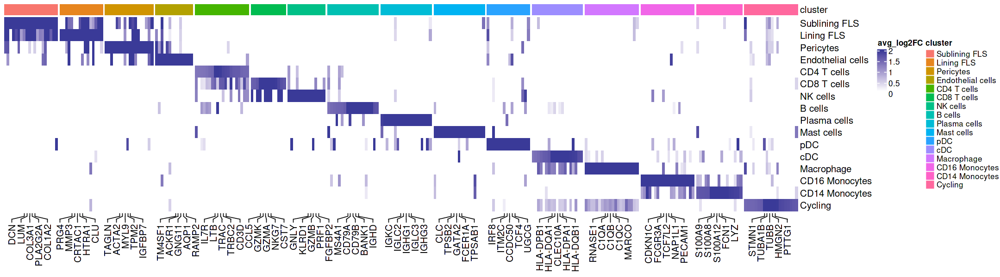

In [30]:
library(scales)
split<-genes_use_df$cluster
options(repr.plot.width=18, repr.plot.height=5)
colnames(.mat)<-NULL
.mat %>% 
    Heatmap(
        name = 'avg_log2FC',
        col = circlize::colorRamp2(c(0, 0.1, 2), c('white', 'white', muted('blue'))),
        #column_names_gp = grid::gpar(fontsize = 10),
#         row_dend_side = "right",
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        top_annotation = clust.anno,
        column_title=NULL,
        bottom_annotation = gene.anno,
        column_split = split,
    )


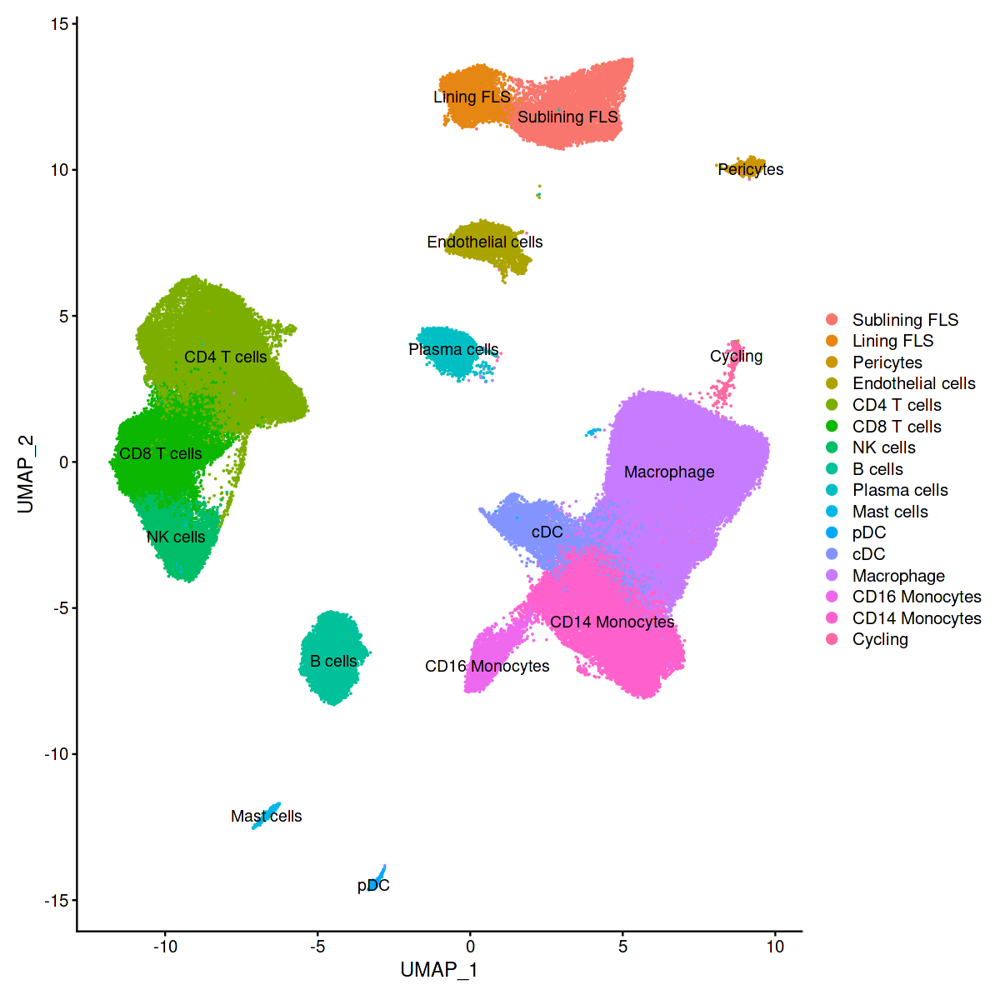

In [104]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

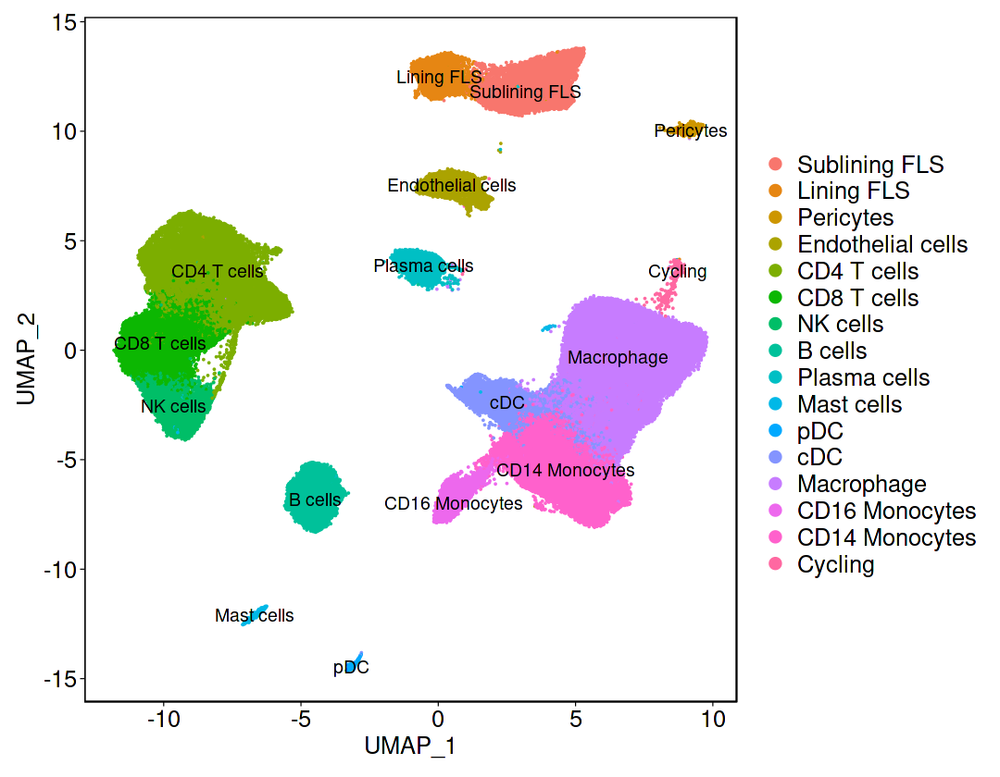

In [6]:
cluster.cols <- hue_pal()(length(unique(Idents(syno))))
options(repr.plot.width=9, repr.plot.height=7)
DimPlot(syno, cols=cluster.cols, group.by="celltype", raster=FALSE, label=TRUE) +NoLegend()+ theme_specific + theme(plot.title=element_blank(),legend.text=element_text(size=15))

# Make detailed UMAP

In [5]:
#Rename your clusters by celltype
syno$Tissue <- plyr::revalue(as.character(syno$Tissue),
                                        c("PB"='Peripheral Blood (PB)', "ST"='Synovial Tissue (ST)'))

In [6]:
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

In [7]:
#Create data frame for information required to plot 
umap <- data.frame(rownames(syno@meta.data),Embeddings(syno, reduction = "umap")[,1], Embeddings(syno, reduction = "umap")[,2],
                   syno$Tissue,syno$celltype)
colnames(umap) <- c("cellID","UMAP1", "UMAP2", "facet_col", "color_col")
allcells <-  as.data.frame(cbind(umap$UMAP1,umap$UMAP2))
colnames(allcells) <- c("UMAP1", "UMAP2")

In [8]:
umap$Cluster <- as.ordered(factor(umap$color_col, levels=levels(syno$celltype)))
umap <- umap[order(umap$color_col),]

In [9]:
umap <- umap[order(umap$cellID),]

In [10]:
#Get co-ordinates for the cluster labels
plt_df <- umap %>%  group_by(color_col) %>% 
        mutate(x_mid = median(UMAP1), y_mid = median(UMAP2), label_col = color_col) %>% 
        ungroup() %>% sample_frac(1)
head(plt_df)

cellID,UMAP1,UMAP2,facet_col,color_col,Cluster,x_mid,y_mid,label_col
<chr>,<dbl>,<dbl>,<chr>,<fct>,<ord>,<dbl>,<dbl>,<fct>
6350256_1,-6.8170927,-12.26436064,Peripheral Blood (PB),Mast cells,Mast cells,-6.6814414,-12.114514,Mast cells
GGTGGCTGTCCGATCG-1_30,5.9910657,-7.30158589,Peripheral Blood (PB),CD14 Monocytes,CD14 Monocytes,4.6593248,-5.478753,CD14 Monocytes
GTATCTTCACAACTGT-1_7_23,0.1592576,13.29622819,Synovial Tissue (ST),Lining FLS,Lining FLS,0.0537417,12.499913,Lining FLS
GTCGGGTTCTACTATC-1_1_1,9.3098981,0.09965106,Synovial Tissue (ST),Macrophage,Macrophage,6.5374433,-0.334030,Macrophage
TGGTTAGAGAGGACTC-1_1_24,-3.1774145,-14.50837538,Synovial Tissue (ST),pDC,pDC,-3.1557391,-14.469816,pDC
GTCATGACAAACTAGA-1_2_28,-8.1458219,3.33264615,Peripheral Blood (PB),CD4 T cells,CD4 T cells,-8.0210179,3.600997,CD4 T cells


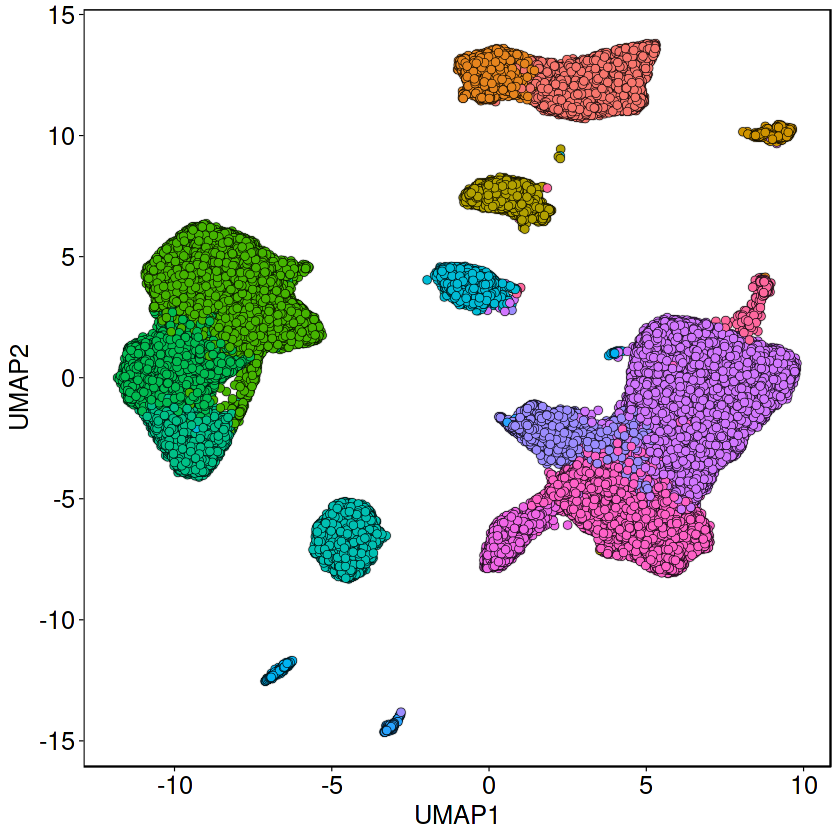

In [31]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=2, shape=21) +
  geom_point(aes(fill=factor(Cluster)),color="black", size=2, shape=21, stroke = 1/5) + 
  scale_fill_manual(name=NULL, labels = levels(umap$Cluster), guide="legend", values=clus.cols) + 
theme_specific + guides(fill=FALSE) 

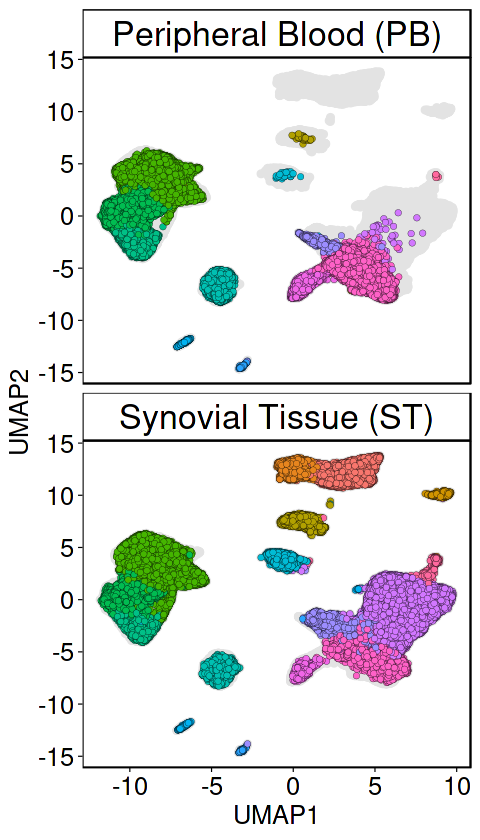

In [32]:
options(repr.plot.width=4, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=1.5, shape=21) +
  geom_point(aes(fill=factor(Cluster)),color="black", size=1.5, shape=21, stroke = 1/10) + facet_wrap(~facet_col, ncol=1) +
  scale_fill_manual(name=NULL, labels = levels(umap$color_col), guide="legend", values=clus.cols) + 
theme_specific + guides(fill=FALSE) 

In [103]:
unique(syno$group)

[1] "Healthy"                 "Naive RA"               
[3] "Remission RA"            "Resistant to cDMARDs RA"
[5] "Resistant to bDMARDs RA" "Difficult to treat RA"

In [104]:
unique(syno$condition)

[1] Healthy      Active RA    Remission RA
Levels: Healthy Active RA Remission RA

In [76]:
#Rename your clusters by celltype
syno$Tissue <- plyr::revalue(as.character(syno$Tissue),
                                        c('Peripheral Blood (PB)'='PB', 'Synovial Tissue (ST)'="ST"))

In [105]:
unique(syno$Tissue)

[1] "ST" "PB"

In [24]:
syno$tissue_condition <- paste0(syno$Tissue, "_", syno$condition)

In [25]:
syno$tissue_condition <- as.ordered(factor(syno$tissue_condition, levels=c("PB_Healthy","PB_Active RA","ST_Healthy","ST_Active RA",
                                                    "ST_Remission RA")))

In [108]:
levels(syno$tissue_condition)

[1] "PB_Healthy"      "PB_Active RA"    "ST_Healthy"      "ST_Active RA"   
[5] "ST_Remission RA"

In [113]:
unique(syno$Donor)

[1] "HC0547"       "HC0572"       "HC0732"       "SA138"        "SA146"       
 [6] "SA172"        "SA132"        "SA160"        "SA161"        "SA174"       
[11] "SA144"        "SA151"        "SA166"        "HC0701"       "SA131"       
[16] "SA145"        "SA139"        "SA159"        "SA168"        "SA220"       
[21] "SA222"        "SA225"        "SA227"        "SA272"        "SA271"       
[26] "SA276"        "PBMC_10X"     "A1"           "A10-RNA"      "A2_HTO2"     
[31] "A5_HTO5"      "A5_HTO3"      "A7_HTO5"      "A7_HTO4"      "A8"          
[36] "A9-RNA"       "A3"           "O1_PB_HD4_MS" "O1_PB_HD3_ML" "O1_PB_HD2_C" 
[41] "O1_PB_HD1_A"  "O3_PB_HD1_A"  "O3_PB_HD3_ML" "O3_PB_HD4_MS" "O3_PB_HD2_C"

In [114]:
table(syno$Donor,syno$group)

              
               Difficult to treat RA Healthy Naive RA Remission RA
  A1                               0       0        0            0
  A10-RNA                          0       0        0         2200
  A2_HTO2                          0     428        0            0
  A3                               0       0        0            0
  A5_HTO3                       4419       0        0            0
  A5_HTO5                          0    5199        0            0
  A7_HTO4                        664       0        0            0
  A7_HTO5                          0     690        0            0
  A8                            1939       0        0            0
  A9-RNA                           0       0        0         2734
  HC0547                           0     738        0            0
  HC0572                           0    1535        0            0
  HC0701                           0    1910        0            0
  HC0732                           0     667   

# Visualize CITEseq expression on Glasgow 3 data

In [10]:
glasgow3 <- subset(syno, subset=Experiment=="Glasgow3")
glasgow3

An object of class Seurat 
19143 features across 20139 samples within 1 assay 
Active assay: RNA (19143 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [11]:
glasgow3orig <- readRDS("/datastore/MKS_Data/UNpublished/DC_paper_Immunity/Immunity_Oxford+Glasgow1-3.rds")
glasgow3orig <- subset(glasgow3orig, subset=Experiment=="Glasgow3")
glasgow3orig <- subset(glasgow3orig, cells = Cells(glasgow3))

In [12]:
glasgow3[["ADT"]] <- CreateAssayObject(data=glasgow3orig@assays$ADT@data)

# Cache data

In [105]:
saveRDS(syno, "./cache/syno.rds")

In [2]:
syno <- readRDS("./cache/syno.rds")

In [3]:
syno

An object of class Seurat 
19143 features across 143851 samples within 1 assay 
Active assay: RNA (19143 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [ ]:
myeloid <- subset(syno, idents=c("Macrophage","cDC","CD14 Monocytes","CD16 Monocytes"))
saveRDS(myeloid, "./cache/myeloid.rds")

In [ ]:
tcells <- subset(syno, idents=c("CD4 T cells","CD8 T cells","NK cells"))
saveRDS(tcells, "./cache/tcells.rds")